In [1]:
from iotools import read_results
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from datetime import date
import os
from netCDF4 import Dataset
import pandas as pd
from iotools import read_AsciiGrid, write_AsciiGrid
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.patches import Polygon
from sklearn.metrics import mean_absolute_error as mae
from rasterio.plot import show
import rasterio
import xarray as xr
from raster_utils import read_pkrasteri_for_extent
from metrics import R2_metrics, MBE_metrics, MAE_metrics, histogram_match
import hvplot.xarray # noqa
import panel.widgets as pnw
import panel as pn
from bokeh.resources import INLINE
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


os.chdir(r'C:\SpaFHy_v1_Pallas_2D\figures')
plt.rcParams['axes.grid'] = True
degree_sign = u'\N{DEGREE SIGN}'

#%%

## reading simulation results
# reading the 1D results
outputfile_1d = r'F:\SpaFHy_2D_2021\res_1d_23.nc'
res_1d = xr.open_dataset(outputfile_1d)

# reading the 2D results
outputfile_2d = r'F:\SpaFHy_2D_2021\res_2d_23.nc'
res_2d = xr.open_dataset(outputfile_2d)

# reading the top results
outputfile_top = r'F:\SpaFHy_2D_2021\res_top_23.nc'
res_top = xr.open_dataset(outputfile_top)
res_top['total_evapotranspiration'] = res_top['bucket_evaporation'] + res_top['canopy_transpiration'] + res_top['canopy_evaporation']

# raster parameters
soilclass = np.array(res_2d['parameters_soilclass'])
cmask = np.array(res_2d['parameters_cmask'])

peat_id = np.where(np.ravel(soilclass == 4))[0]
mineral_id = np.where(np.ravel(soilclass == 2))[0]

dates_spa = []
for d in range(len(res_1d['time'])):
    dates_spa.append(pd.to_datetime(str(res_1d['time'][d])[36:46]))
dates_spa = pd.to_datetime(dates_spa)

# reading basic map
pkfp = 'C:\SpaFHy_v1_Pallas_2D/testcase_input/parameters/pkmosaic_clipped.tif'
bbox = [res_1d['lon'].min(), res_1d['lon'].max(), res_1d['lat'].min(), res_1d['lat'].max()]
pk, meta = read_pkrasteri_for_extent(pkfp, bbox, showfig=False)

# reading SAR files
sar_mfile = r'F:\SpaFHy_2D_2021\PALLAS_RAW_DATA\SAR_maankosteus\processed\m16_nc_spafhy_pallas\original\SAR_SM_PALLAS_2019_16M_TM35_CATCHMENT_morning.nc'
sar_m = xr.open_dataset(sar_mfile) * cmask

sar_efile = r'F:\SpaFHy_2D_2021\PALLAS_RAW_DATA\SAR_maankosteus\processed\m16_nc_spafhy_pallas\original\SAR_SM_PALLAS_2019_16M_TM35_CATCHMENT_evening.nc'
sar_e = xr.open_dataset(sar_efile) * cmask

dates_sar_m = []
dates_sar_e = []

for d in range(len(sar_m['time'])):
    dates_sar_m.append(pd.to_datetime(str(sar_m['time'][d])[36:46]))
    dates_sar_e.append(pd.to_datetime(str(sar_e['time'][d])[36:46]))

dates_sar_m = pd.to_datetime(dates_sar_m).sort_values()
dates_sar_e = pd.to_datetime(dates_sar_e).sort_values()

sar_mask = np.array(sar_m['theta'][0].copy())
sar_mask[sar_mask >= 0] = 1
sar_mask = sar_mask.reshape(sar_m['theta'][0].shape) * cmask

# parameters
today = date.today()
saveplots = True

# distributed radiation
distradfile = r'C:\SpaFHy_v1_Pallas_2D/obs/rad_ds.nc'
distrad = xr.open_dataset(distradfile)

# indexes for tighet plots
zx = np.arange(20, 171, 1)
zy = np.arange(20, 246, 1)

# defining important raster locations
ht = [118,136] # hilltop
om = [46, 54]   # open mire

ffile = r'C:\SpaFHy_v1_Pallas_2D/testcase_input/forcing/Kenttarova_forcing_era5.csv'
forc = pd.read_csv(ffile, sep=';', index_col=0, parse_dates=True)

#%%

# simple tests for simulation files
try:
    res_1d['time'] in res_2d['time'] in res_top['time']
    print('Simulation times are a MATCH!')
except ValueError:
    print('Simulation times DO NOT match!')
try:
    res_1d['lat'] in res_2d['lat'] in res_top['lat'] and res_1d['lon'] in res_2d['lon'] in res_top['lon']
    print('Simulation extents are a MATCH!')
except ValueError:
    print('Simulation extents DO NOT match!')

# simple tests for SAR files # !!! if false does not print DO NOT
try:
    sar_m['time'] in sar_e['time']
    print('SAR dates are a MATCH!')
except ValueError:
    print('SAR dates DO NOT match!')
try:
    sar_m['lat'] in sar_e['lat'] and sar_m['lon'] in sar_e['lon']
    print('SAR extents are a MATCH!')
except ValueError:
    print('SAR extents DO NOT match!')

# simple tests for SAR + SpaFHy files
try:
    sar_m['lat'] in sar_e['lat'] in res_1d['lat'] and sar_m['lon'] in sar_e['lon'] in res_1d['lon']
    print('SAR and SpaFHy extents are a MATCH!')
except ValueError:
    print('SAR and SpaFHy extents DO NOT match!')
try:
    sar_m['time'] in sar_e['time'] in res_1d['time']
    print('SAR and SpaFHy times are a MATCH!')
except ValueError:
    print('SAR and SpaFHy times DO NOT match!')

Simulation times are a MATCH!
Simulation extents are a MATCH!
SAR dates are a MATCH!
SAR extents are a MATCH!
SAR and SpaFHy extents are a MATCH!
SAR and SpaFHy times are a MATCH!


In [2]:
import geopandas as gpd
# READING POINT OBSERVATIONS

# 1 discharge
fn1 = r'C:\SpaFHy_v1_Pallas_2D\obs\Runoffs1d_SVEcatchments_mmd_new.csv'
q = pd.read_csv(fn1, sep=';', index_col=0, parse_dates=True)
q = q.loc[q.index.isin(dates_spa)]

# 2 swe
fn2 = r'C:\SpaFHy_v1_Pallas_2D\obs\swe_mm.csv'
swe = pd.read_csv(fn2, sep=';', index_col=0, parse_dates=True)

# 3 kenttärova soil moisture
fn3 = r'C:\SpaFHy_v1_Pallas_2D\obs\theta_kenttarova.csv'
theta = pd.read_csv(fn3, sep=';', index_col=0, parse_dates=True)

# 4 groundwater levels
fn4 = r'C:\SpaFHy_v1_Pallas_2D\obs\gw_levels.csv'
gw = pd.read_csv(fn4, sep=';', index_col=0, parse_dates=True)

# 5 evapotranspiration
fn5 = r'C:\SpaFHy_v1_Pallas_2D\obs\ec_et.csv'
et = pd.read_csv(fn5, sep=';', index_col=0, parse_dates=True)

# 6 spatial soil moisture
fn6 = r'C:\SpaFHy_v1_Pallas_2D\obs\theta_spatial.nc'
theta_spat = xr.open_dataset(fn6)

# 7 spatial soil moisture geopandas
fn7 = r'C:\Users\janousu\OneDrive - Oulun yliopisto\Pallas data\DATABASE\SOIL MOISTURE AND TEMPERATURE\PROCESSING\Spatial\final_catchment_SM_mean_gpd_JP.csv'
theta_spat_gpd = pd.read_csv(fn7, sep=';', index_col=0, parse_dates=True)
theta_spat_gpd = gpd.GeoDataFrame(theta_spat_gpd)
theta_spat_gpd['geometry'] = gpd.GeoSeries.from_wkt(theta_spat_gpd['geometry'])

In [3]:
# creating pd dataframes for those sim vs. obs we want scatterplots of
# soil moisture at hilltop and open mire

temporaldf = pd.DataFrame()

temporaldf['2d_bucket_moisture_root_ht'] = res_2d['bucket_moisture_root'][:,ht[0],ht[1]]
temporaldf['top_bucket_moisture_root_ht'] = res_top['bucket_moisture_root'][:,ht[0],ht[1]]

temporaldf['2d_bucket_moisture_root_om'] = res_2d['bucket_moisture_root'][:,om[0],om[1]]
temporaldf['top_bucket_moisture_root_om'] = res_top['bucket_moisture_root'][:,om[0],om[1]]

temporaldf.index = dates_spa

temporaldf['obs_mean_moisture_root_ht'] = theta['mean_obs']
temporaldf['obs_min_moisture_root_ht'] = theta['min']
temporaldf['obs_max_moisture_root_ht'] = theta['max']

temporaldf['obs_swe_mean_ca'] = np.nanmean(res_1d['canopy_snow_water_equivalent'], axis=(1,2))

##

# spatial manual measurements and closest grid-cell
spat_theta_pair = pd.DataFrame()
obs_list = []
mod_list_1d = []
mod_list_2d = []
mod_list_top = []
mod_list_1d_peat = []
mod_list_2d_peat = []
mod_list_top_peat = []
mod_list_1d_mineral = []
mod_list_2d_mineral = []
mod_list_top_mineral = []

for i in theta_spat_gpd.index.unique():
    data = theta_spat_gpd.loc[i]
    #data = data.loc[data['z'] != 0]
    for j in data['ID_i'].unique():
        point = data.loc[data['ID_i'] == j]
        coords = point['geometry'][0]
        time = point.index[0]
        if len(point) > 1:
            theta_obs = float(point['theta'].mean())
        else:
            theta_obs = float(point['theta'])
        obs_list.append(theta_obs)
        mod_list_top.append(float(res_top['bucket_moisture_root'].sel(time=time,
                                                           lat=coords.y, lon=coords.x,
                                                           method='nearest')))
        mod_list_1d.append(float(res_1d['bucket_moisture_root'].sel(time=time,
                                                           lat=coords.y, lon=coords.x,
                                                           method='nearest')))
        mod_list_2d.append(float(res_2d['bucket_moisture_root'].sel(time=time,
                                                           lat=coords.y, lon=coords.x,
                                                           method='nearest')))
spat_theta_pair['obs'] = obs_list
spat_theta_pair['mod_1d'] = mod_list_1d
spat_theta_pair['mod_2d'] = mod_list_2d
spat_theta_pair['mod_top'] = mod_list_top

# because we do not want to assess winter soil moisture (no soil freezing modelled)
temporaldf.loc[temporaldf['obs_swe_mean_ca']  > 0, '2d_bucket_moisture_root_ht'] = np.nan
temporaldf.loc[temporaldf['obs_swe_mean_ca']  > 0, 'top_bucket_moisture_root_ht'] = np.nan
temporaldf.loc[temporaldf['obs_swe_mean_ca']  > 0, 'obs_mean_moisture_root_ht'] = np.nan
temporaldf.loc[temporaldf['obs_swe_mean_ca']  > 0, 'obs_min_moisture_root_ht'] = np.nan
temporaldf.loc[temporaldf['obs_swe_mean_ca']  > 0, 'obs_max_moisture_root_ht'] = np.nan

C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\728264701.py:68: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(['coarse', 'medium', 'fine', 'peat'])
C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\728264701.py:77: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(['forest', 'spruce mire', 'pine mire', 'open mire'])
C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\728264701.py:86: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(['stream', 'land'])


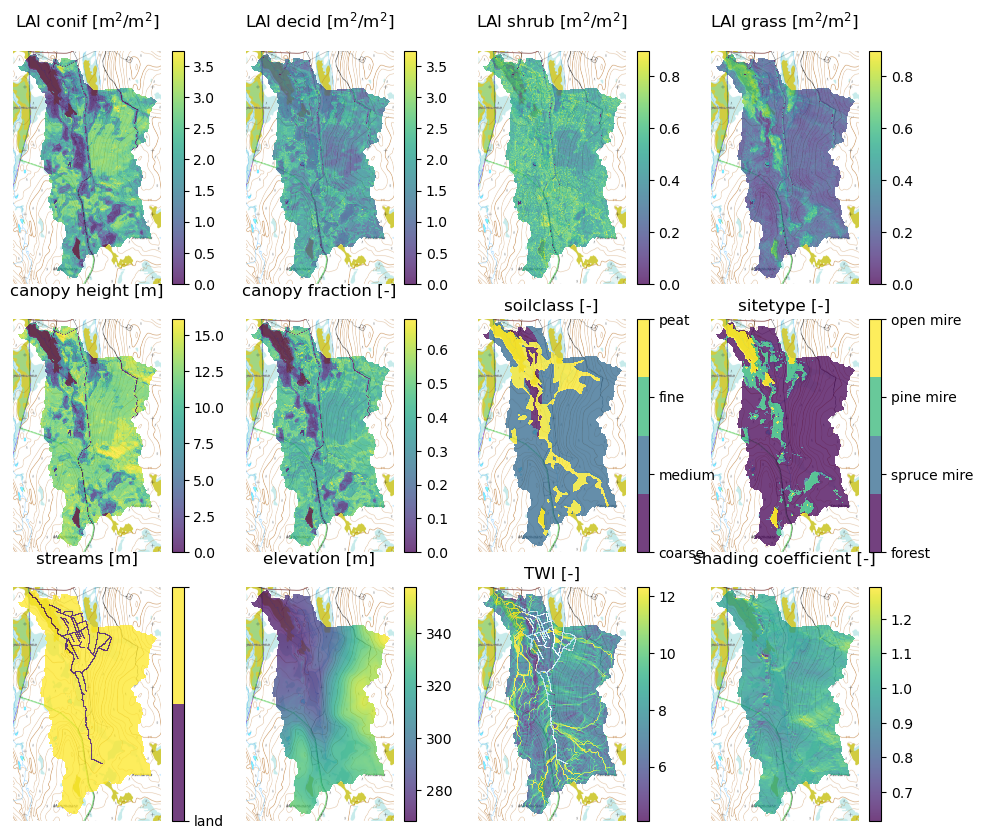

In [4]:
os.chdir(r'C:\SpaFHy_v1_Pallas_2D\figures')

alp=0.75

# GIS PLOT

# Plotting
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(12,10));
ax1 = axs[0][0]
ax2 = axs[0][1]
ax3 = axs[0][2]
ax4 = axs[0][3]

ax5 = axs[1][0]
ax6 = axs[1][1]
ax7 = axs[1][2]
ax8 = axs[1][3]

ax9 = axs[2][0]
ax10 = axs[2][1]
ax11 = axs[2][2]
ax12 = axs[2][3]


#im1 = ax1.imshow(res_2d['parameters_lai_conif'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = res_2d['parameters_lai_conif'][20:250,20:165].plot(ax=ax1, alpha=alp, add_colorbar=False, vmin=0, vmax=3.75)
ax1.set_title(r'LAI conif [m$^2$/m$^2$]')
fig.colorbar(im1, ax=ax1)

#im2 = ax2.imshow(res_2d['parameters_lai_decid_max'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
im2 = res_2d['parameters_lai_decid_max'][20:250,20:165].plot(ax=ax2, alpha=alp, add_colorbar=False, vmin=0, vmax=3.75)
ax2.set_title(r'LAI decid [m$^2$/m$^2$]')
fig.colorbar(im2, ax=ax2)

#im3 = ax3.imshow(res_2d['parameters_lai_shrub'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax3);
im3 = res_2d['parameters_lai_shrub'][20:250,20:165].plot(ax=ax3, alpha=alp, add_colorbar=False, vmin=0, vmax=0.9)
ax3.set_title(r'LAI shrub [m$^2$/m$^2$]')
fig.colorbar(im3, ax=ax3)

#im4 = ax4.imshow(res_2d['parameters_lai_grass'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax4);
im4 = res_2d['parameters_lai_grass'][20:250,20:165].plot(ax=ax4, alpha=alp, add_colorbar=False, vmin=0, vmax=0.9)
ax4.set_title(r'LAI grass [m$^2$/m$^2$]')
fig.colorbar(im4, ax=ax4)

#im5 = ax5.imshow(res_2d['parameters_hc'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax5);
im5 = res_2d['parameters_hc'][20:250,20:165].plot(ax=ax5, alpha=alp, add_colorbar=False)
ax5.set_title('canopy height [m]')
fig.colorbar(im5, ax=ax5)

#im6 = ax6.imshow(res_2d['parameters_cf'][20:250,20:165], label='canopy fraction')
rasterio.plot.show(pk, transform=meta['transform'], ax=ax6);
im6 = res_2d['parameters_cf'][20:250,20:165].plot(ax=ax6, alpha=alp, add_colorbar=False)
ax6.set_title('canopy fraction [-]')
fig.colorbar(im6, ax=ax6)

cmapsoil = plt.get_cmap('viridis', 4)
#im7 = ax7.imshow(res_2d['parameters_soilclass'][20:250,20:165], cmap=cmapsoil)
rasterio.plot.show(pk, transform=meta['transform'], ax=ax7);
im7 = res_2d['parameters_soilclass'][20:250,20:165].plot(ax=ax7, alpha=alp, cmap=cmapsoil, add_colorbar=False)
ax7.set_title('soilclass [-]')
cbar = fig.colorbar(im7, ax=ax7)
cbar.ax.locator_params(nbins=4)
cbar.ax.set_yticklabels(['coarse', 'medium', 'fine', 'peat'])

cmapsite = plt.get_cmap('viridis', 4)
#im8 = ax8.imshow(res_2d['parameters_sitetype'][20:250,20:165], cmap=cmapsite)
rasterio.plot.show(pk, transform=meta['transform'], ax=ax8);
im8 = res_2d['parameters_sitetype'][20:250,20:165].plot(ax=ax8, alpha=alp, cmap=cmapsite, add_colorbar=False)
ax8.set_title('sitetype [-]')
cbar = fig.colorbar(im8, ax=ax8)
cbar.ax.locator_params(nbins=4)
cbar.ax.set_yticklabels(['forest', 'spruce mire', 'pine mire', 'open mire'])

cmapditch = plt.get_cmap('viridis', 2)
#im9 = ax9.imshow(res_2d['parameters_ditches'][20:250,20:165], cmap=cmapditch)
rasterio.plot.show(pk, transform=meta['transform'], ax=ax9);
im9 = res_2d['parameters_ditches'][20:250,20:165].plot(ax=ax9, alpha=alp, cmap=cmapditch, add_colorbar=False)
ax9.set_title('streams [m]')
cbar = fig.colorbar(im9, ax=ax9)
cbar.ax.locator_params(nbins=1)
cbar.ax.set_yticklabels(['stream', 'land'])

# = ax10.imshow(res_2d['parameters_elevation'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax10);
im10 = res_2d['parameters_elevation'][20:250,20:165].plot(ax=ax10, alpha=alp, add_colorbar=False)
ax10.set_title('elevation [m]')
fig.colorbar(im10, ax=ax10)

#im11 = ax11.imshow(res_top['parameters_twi'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax11);
im11 = res_top['parameters_twi'][20:250,20:165].plot(ax=ax11, alpha=alp, add_colorbar=False)
ax11.set_title('TWI [-]')
fig.colorbar(im11, ax=ax11)

#im12 = ax12.imshow(results_catch['parameters_twi'][20:250,20:165])
rasterio.plot.show(pk, transform=meta['transform'], ax=ax12);
im12 = (distrad['c_rad'].mean(dim='time')*cmask)[20:250,20:165].plot(ax=ax12, alpha=alp, add_colorbar=False)
ax12.set_title('shading coefficient [-]')
fig.colorbar(im12, ax=ax12)

ax1.axis('off'); ax2.axis('off'); ax3.axis('off'); ax4.axis('off')
ax5.axis('off'); ax6.axis('off'); ax7.axis('off'); ax8.axis('off')
ax9.axis('off'); ax10.axis('off'); ax11.axis('off'); ax12.axis('off')

#plt.tight_layout()
#ax10.imshow(results_2d['parameters_twi'][20:250,20:165])

plt.subplots_adjust(wspace=0, hspace=0.15)

if saveplots == True:
        plt.savefig(f'GIS_rasters_{today}.pdf',bbox_inches='tight', dpi=300)
        plt.savefig(f'GIS_rasters_{today}.png',bbox_inches='tight', dpi=300)


In [10]:
####################################################
# WATER BALANCE ANNUAL PLOT
####################################################

# yearly water balance in meters for whole area
wbdf = pd.DataFrame()
wbdf['P'] = res_2d['forcing_precipitation']
wbdf['SWE'] = np.nanmean(res_1d['canopy_snowfall'], axis=(1,2))
wbdf.index = dates_spa
wbdf['Qmod'] = res_top['top_baseflow'] + np.nanmean(res_top['bucket_surface_runoff'], axis=(1,2))
wbdf['ETmod'] = np.nanmean(res_top['canopy_evaporation'] + res_top['canopy_transpiration'] + res_top['bucket_evaporation'], axis=(1,2))
#wbdf['ETdrymod'] = np.nanmean(results_catch['dry_et'], axis=(1,2))
wbdf['S'] = np.nanmean(res_top['bucket_water_storage'], axis=(1,2)) + np.nanmean(res_top['canopy_snow_water_equivalent'], axis=(1,2)) + np.nanmean(res_top['canopy_water_storage'], axis=(1,2))
#wbdf['S'] = np.nanmean((results_catch['bucket_water_storage'] + results_catch['canopy_snow_water_equivalent'] + results_catch['canopy_water_storage'] + results_catch['bucket_pond_storage']), axis=(1,2))

wbdfy = pd.DataFrame()
wbdfy['P'] = wbdf['P'].resample('AS-SEP').sum()
wbdfy['SWE'] = wbdf['SWE'].resample('AS-SEP').sum()
wbdfy['Qmod'] = wbdf['Qmod'].resample('AS-SEP').sum()
#wbdfy['ETdrymod'] = wbdf['ETdrymod'].resample('AS-SEP').sum()
wbdfy['ETmod'] = wbdf['ETmod'].resample('AS-SEP').sum()
wbdfy['S'] = np.nan
wbdfy['Qobs'] = q.resample('AS-SEP').sum()
wbdfy.loc[wbdfy['Qobs'] < 220, 'Qobs'] = np.nan

wbdf2d = pd.DataFrame()
wbdf2d['P'] = res_2d['forcing_precipitation']
wbdf2d['SWE'] = np.nanmean(res_2d['canopy_snowfall'], axis=(1,2))
wbdf2d.index = dates_spa
wbdf2d['Qmod'] = np.nanmean(res_2d['soil_netflow_to_ditch'] + res_2d['bucket_surface_runoff'], axis=(1,2))
#wbdf2d['ETdrymod'] = wbdf['ETdrymod'].resample('Y').sum()
wbdf2d['ETmod'] = np.nanmean(res_2d['canopy_evaporation'] + res_2d['canopy_transpiration'] + res_2d['bucket_evaporation'], axis=(1,2))
wbdf2d['S'] = np.nanmean(res_2d['bucket_water_storage'] + res_2d['canopy_snow_water_equivalent'] + res_2d['canopy_water_storage'] + res_2d['soil_water_storage'], axis=(1,2))

wbdf2dy = pd.DataFrame()
wbdf2dy['P'] = wbdf2d['P'].resample('AS-SEP').sum()
wbdf2dy['SWE'] = wbdf2d['SWE'].resample('AS-SEP').sum()
wbdf2dy['Qmod'] = wbdf2d['Qmod'].resample('AS-SEP').sum()
wbdf2dy['ETmod'] = wbdf2d['ETmod'].resample('AS-SEP').sum()
#wbdf2dy['ETdrymod'] = wbdf2d['ETdrymod'].resample('AS-SEP').sum()
wbdf2dy['S'] = np.nan
wbdf2dy['Qobs'] = q.resample('AS-SEP').sum()
wbdf2dy.loc[wbdf2dy['Qobs'] < 220, 'Qobs'] = np.nan

monthly_clim = pd.DataFrame()
monthly_clim['T'] = forc['t_mean'].groupby(forc.index.month).mean()
monthly_clim['Tmin'] = forc['t_min'].groupby(forc.index.month).mean()
monthly_clim['Tmax'] = forc['t_max'].groupby(forc.index.month).mean()
monthly_clim['P'] = forc['rainfall'].resample('M').sum().groupby(forc['rainfall'].resample('M').sum().index.month).mean()
#monthly_clim['P'] = forc['rainfall'].groupby(forc.index.month).mean()
monthly_clim['R'] = forc['radiation'].groupby(forc.index.month).mean()
monthly_clim['HN'] = forc['snowdepth'].groupby(forc.index.month).mean()
monthly_clim.loc[monthly_clim['HN'] < 0, 'HN'] = 0

rowindices = [8,9,10,11,0,1,2,3,4,5,6,7]
monthly_clim = monthly_clim.iloc[np.array(rowindices)]
monthly_clim.index = ['9', '10', '11', '12', '1', '2', '3', '4', '5', '6', '7', '8']

sday=1
eday=31
smonth=1
emonth=12
for i in range(len(wbdfy)):
    year = wbdfy.index[i].year
    #start = np.where((wbdf.index.year == year) & (wbdf.index.month == smonth) & (wbdf.index.day == sday))[0]
    #end = np.where((wbdf.index.year == year) & (wbdf.index.month == emonth) & (wbdf.index.day == eday))[0]
    start = np.where((wbdf.index.year == year) & (wbdf.index.month == 9) & (wbdf.index.day == 1))[0]
    end = np.where((wbdf.index.year == year + 1) & (wbdf.index.month == 9) & (wbdf.index.day == 1))[0]
    if len(start) + len(end) > 1:
        wbdfy['S'][i] = float(wbdf['S'][start]) - float(wbdf['S'][end])
        wbdf2dy['S'][i] = float(wbdf2d['S'][start]) - float(wbdf2d['S'][end])

wbdfy['closure'] = wbdfy['P'] - wbdfy['Qmod'] - wbdfy['ETmod'] + wbdfy['S']
wbdf2dy['closure'] = wbdf2dy['P'] - wbdf2dy['Qmod'] - wbdf2dy['ETmod'] + wbdf2dy['S']
wbdfy = wbdfy[1:-1]
wbdf2dy =  wbdf2dy[:-1]

wbplot = wbdfy.mean()

C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\2461679942.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wbdfy['Qobs'].loc[wbdfy['Qobs'] < 220] = np.nan
C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\2461679942.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wbdf2dy['Qobs'].loc[wbdf2dy['Qobs'] < 220] = np.nan
C:\Users\janousu\AppData\Local\Temp\ipykernel_20060\2461679942.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [38]:
np.isfinite(wbdf2dy['Qobs'][4])

False

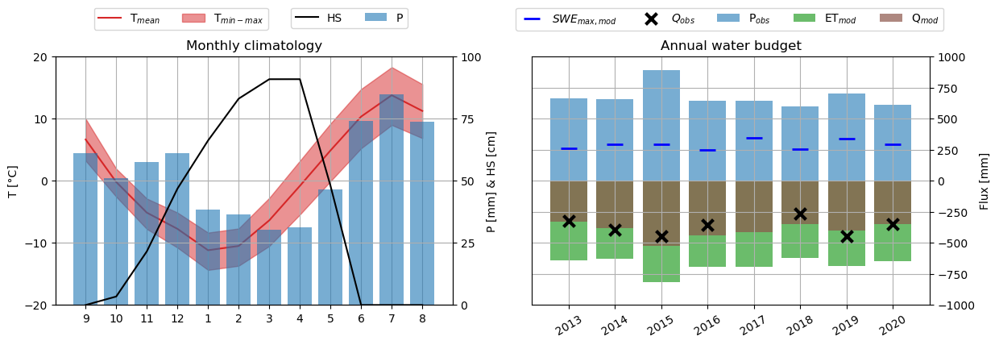

In [73]:
# Plotting water budget and climatology
#wbdf2dy['Qobs'] = wbdf2dy['Qobs'].fillna(-999)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14,4));
ax0 = axs[0]
ax1 = axs[1]

ax0b = ax0.twinx()
ax0.plot(monthly_clim['T'], color='tab:red', label=r'T$_{mean}$',zorder=5)
ax0b.bar(monthly_clim.index, monthly_clim['P'], alpha=0.6, label='P',zorder=0)
ax0.fill_between(monthly_clim.index, monthly_clim['Tmin'], monthly_clim['Tmax'],
                 color='tab:red', alpha=0.5, label=r'T$_{min-max}$',zorder=1)
ax0b.plot(monthly_clim['HN'], color='black', label='HS',zorder=2)
#ax0.plot(monthly_clim.index, monthly_clim['R']/10, color='tab:orange', alpha=0.4)
ax0.legend(ncol=5,bbox_to_anchor=(0.55, 1.22))
ax0b.legend(ncol=5,bbox_to_anchor=(0.9, 1.22))

#ax0c = ax0.twinx()
#ax0c.stackplot(monthly_clim.index, monthly_clim['R'], colors='tab:orange', alpha=0.3)

for i in range(len(wbdf2dy)):
    ax1.bar(str(wbdf2dy.index[i].year), wbdf2dy['P'][i], alpha=0.6, color='tab:blue', label=r'P$_{obs}$')
    ax1.bar(str(wbdf2dy.index[i].year), - wbdf2dy['ETmod'][i] - wbdf2dy['Qmod'][i], color='tab:green', alpha=0.7, label=r'ET$_{mod}$')
    ax1.bar(str(wbdf2dy.index[i].year), - wbdf2dy['Qmod'][i], alpha=0.7, color='tab:brown', label=r'Q$_{mod}$')
    ax1.scatter(str(wbdf2dy.index[i].year), wbdf2dy['SWE'][i], s=200, marker='_', color='b', linewidth=2, zorder=2, label=r'$SWE_{max,mod}$')
    if np.isfinite(wbdf2dy['Qobs'][i]):
        ax1.scatter(str(wbdf2dy.index[i].year), - wbdf2dy['Qobs'][i], s=100, marker='x', color='k', linewidth=3, zorder=2, label=r'$Q_{obs}$')
    ax1.set_ylim(-1000, 1000)
    if i == 0:
        ax1.legend(ncol=5,bbox_to_anchor=(1.05, 1.22))

ax1.xaxis.set_tick_params(rotation=30)

#ax0.set_ylim([-20,20])
ax1.yaxis.tick_right()
ax1.yaxis.set_label_position("right")

ax0.set_yticks(np.arange(-20, 21, 10))
ax0b.set_yticks(np.arange(0, 101, 25))
ax0.set_ylabel(f'T [{degree_sign}C]')
ax0b.set_ylabel('P [mm] & HS [cm]')

ax1.set_ylabel('Flux [mm]')
ax1.set_title('Annual water budget')
ax0.set_title('Monthly climatology')

plt.subplots_adjust(wspace=0.2, hspace=0.7)

if saveplots == True:
        plt.savefig(f'clima_and_water_{today}.pdf',bbox_inches='tight', dpi=300)
        plt.savefig(f'clima_and_water_{today}.png',bbox_inches='tight', dpi=300)

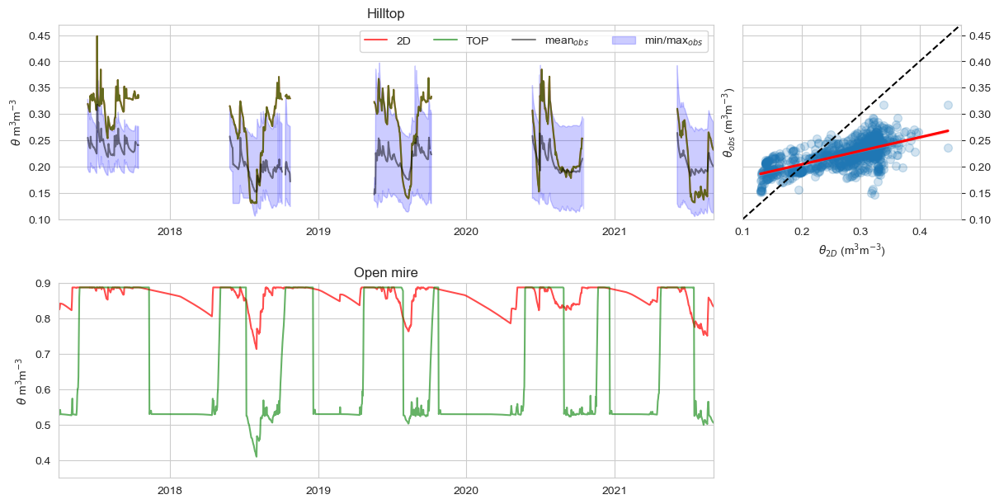

In [78]:
# TEMPORAL SOIL MOISTURE ET HILLTOP (KENTTÄROVA)
# Plotting

period = pd.date_range('2017-04-01', '2021-09-01', freq='D')

ylims = [0.1,0.47]
###
fig = plt.figure(constrained_layout=True, figsize=(12,6))
gs = fig.add_gridspec(2, 4)
sns.set_style('whitegrid')

ax1 = fig.add_subplot(gs[0, :3])
ax1.set_title('Hilltop')
im1 = temporaldf.loc[period, '2d_bucket_moisture_root_ht'].plot(ax=ax1, color='red', alpha=0.7, label='2D')
temporaldf.loc[period, 'top_bucket_moisture_root_ht'].plot(ax=ax1, color='g', alpha=0.6, label='TOP')
temporaldf.loc[period, 'obs_mean_moisture_root_ht'].plot(color='k', alpha=0.5, label=r'mean$_{obs}$')
ax1.fill_between(temporaldf.index[temporaldf.index.isin(period)], temporaldf.loc[period, 'obs_min_moisture_root_ht'], temporaldf.loc[period,'obs_max_moisture_root_ht'],
                 color='blue', alpha=0.2, label=r'min/max$_{obs}$')
ax1.legend(ncol=5)

y = ax1.set_ylabel(r'$\theta$ m$^3$m$^{-3}$')
ax1.set_ylim(ylims)
#ax1.axes.get_xaxis().set_ticklabels([])

ax2 = fig.add_subplot(gs[0, 3])
im2 = sns.regplot(ax=ax2, x=temporaldf['top_bucket_moisture_root_ht'], y=temporaldf['obs_mean_moisture_root_ht'], scatter_kws={'s':50, 'alpha':0.2}, line_kws={"color": "red"})
ax2.set(ylim=(ylims))
ax2.set(xlim=(ylims))
ax2.yaxis.tick_right()
ax2.set_ylabel(r'$\theta_{obs}$ (m$^3$m$^{-3}$)')
ax2.set_xlabel(r'$\theta_{2D}$ (m$^3$m$^{-3}$)')
ax2.plot(ylims, ylims, 'k--')


ax3 = fig.add_subplot(gs[1, :3])
ax3.set_title('Open mire')
im3 = temporaldf.loc[period, '2d_bucket_moisture_root_om'].plot(ax=ax3, color='red', alpha=0.7, label='2D')
temporaldf.loc[period, 'top_bucket_moisture_root_om'].plot(ax=ax3, color='green', alpha=0.6, label='TOP')
ax1.legend(ncol=5)
ax3.set_ylim(0.35,0.9)
ax3.set_ylabel(r'$\theta$ m$^3$m$^{-3}$')
#f3_ax3.legend(ncol=5)


if saveplots == True:
        plt.savefig(f'theta_model_ts_{today}.pdf', bbox_inches='tight', dpi=300)
        plt.savefig(f'theta_model_ts_{today}.png', bbox_inches='tight', dpi=300)

ValueError: too many values to unpack (expected 2)

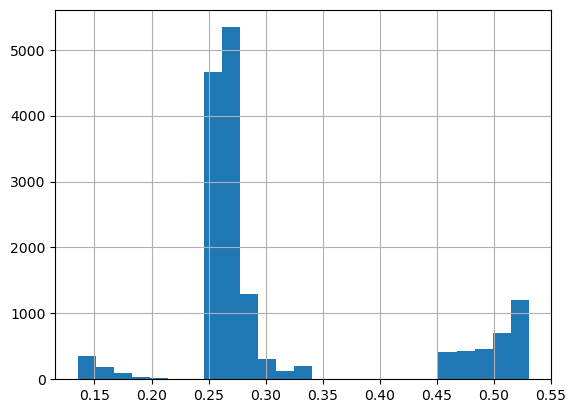

In [67]:
n,x = plt.hist(res_1d['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_1d['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=25)
bin_centers = 0.5*(x[1:]+x[:-1])
plt.plot(bin_centers,n, color='tab:blue') 
n,x = plt.hist(res_2d['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_2d['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=25)
bin_centers = 0.5*(x[1:]+x[:-1])
plt.plot(bin_centers,n, color='tab:orange') 
n,x = plt.hist(res_top['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_top['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=25)
bin_centers = 0.5*(x[1:]+x[:-1])
plt.plot(bin_centers,n, color='tab:green') 

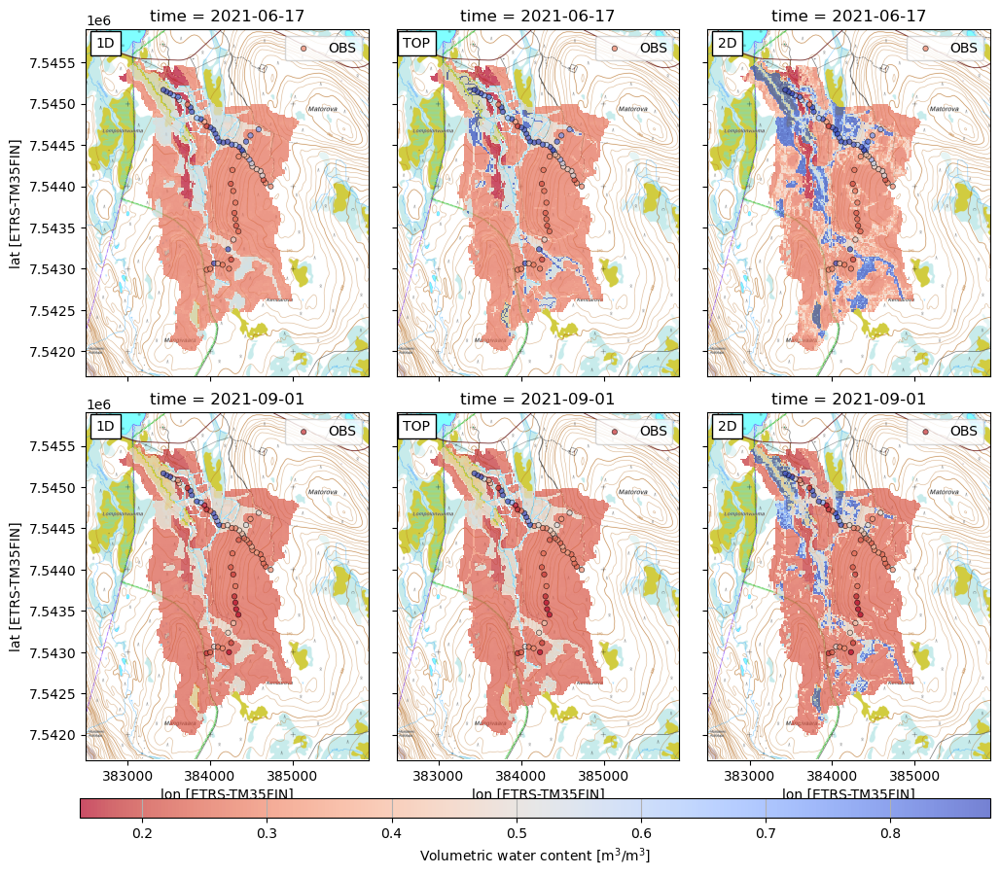

In [134]:
# SPAFHY SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY

start = np.where(pd.to_datetime(dates_spa) == '2021-05-01')[0][0]
end = np.where(pd.to_datetime(dates_spa) == '2021-09-01')[0][0]

d1 = '2021-06-17'
doi1 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d1)[0][0]
doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]
d2 = '2021-09-01'
doi2 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d2)[0][0]
doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]

ms = 15

alp=0.7
ylims = [0.15,0.88]
fig = plt.figure(figsize=(12,10))
gs = fig.add_gridspec(2, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])

rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = res_1d['bucket_moisture_root'][start:end][doi1].plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax1.legend()
rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im2 = res_top['bucket_moisture_root'][start:end][doi1].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax2.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3)

res_2d['bucket_moisture_root'][start:end][doi1].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax3.legend()
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax4);
im4 = res_1d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax4, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax4, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax4.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax5);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im5 = res_top['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax5, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax5, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax5.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax6)

res_2d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax6, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
# TEST to see all locations
#theta_spat_gpd.loc[(theta_spat_gpd.index != d1) & (theta_spat_gpd.index != d2)][['theta', 'geometry']].plot(column='theta',
#                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
#                                              markersize=25,
#                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax6.legend()
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()

props = dict(facecolor='white', alpha=1)

ax1.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)
ax2.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)
ax3.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)

ax4.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax4.transAxes,
     bbox=props)
ax5.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax5.transAxes,
     bbox=props)
ax6.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax6.transAxes,
     bbox=props)

ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_ylabel('')
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')

ax1.axes.get_xaxis().set_ticklabels([])
ax1.set_xlabel('')
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_xlabel('')
ax3.axes.get_xaxis().set_ticklabels([])
ax3.set_xlabel('')

ax5.axes.get_yaxis().set_ticklabels([])
ax5.set_ylabel('')
ax6.axes.get_yaxis().set_ticklabels([])
ax6.set_ylabel('')

cax = plt.axes([0.12, 0.06, 0.78, 0.02])
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label(r'Volumetric water content [m$^3$/m$^3$]')

plt.subplots_adjust(wspace=0.1, hspace=0.05)

plt.savefig(f'spatial_models_2021_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_models_2021_{today}.png', bbox_inches='tight', dpi=300)

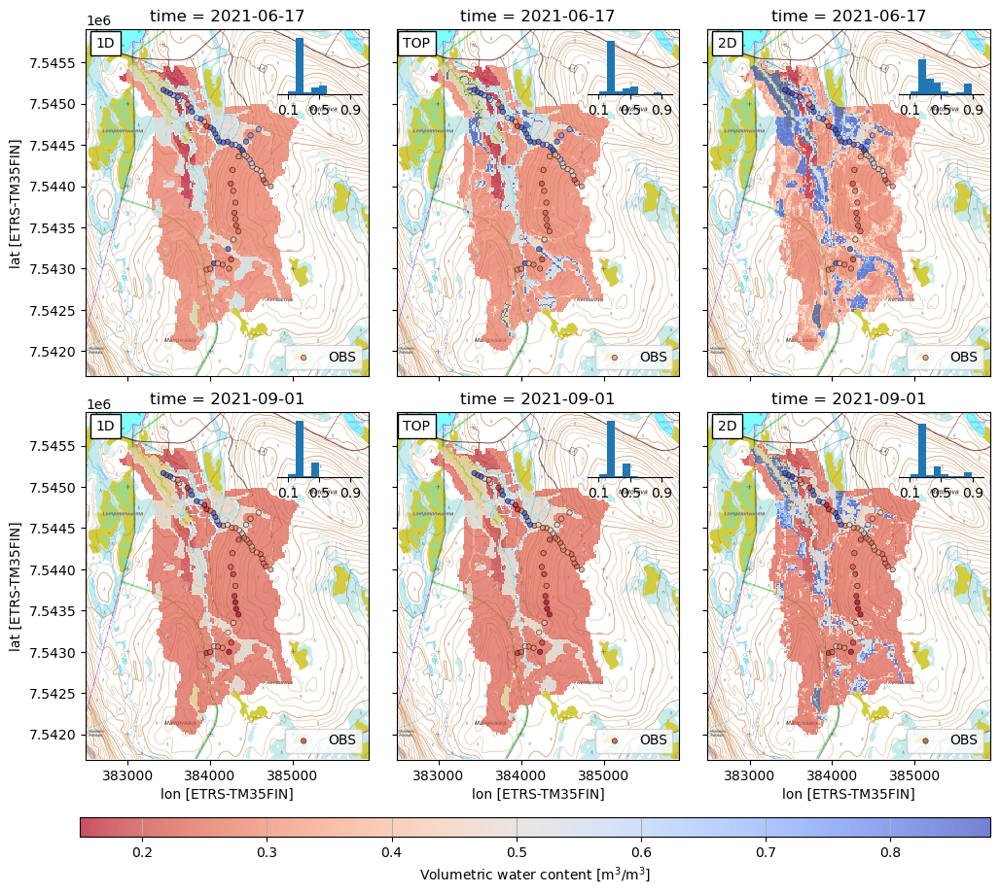

In [139]:
# SPAFHY SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY

lims = [0.01,0.99]
bins = 10
ms = 15

start = np.where(pd.to_datetime(dates_spa) == '2021-05-01')[0][0]
end = np.where(pd.to_datetime(dates_spa) == '2021-09-01')[0][0]

d1 = '2021-06-17'
doi1 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d1)[0][0]
doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]
d2 = '2021-09-01'
doi2 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d2)[0][0]
doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]

alp=0.7
ylims = [0.15,0.88]
fig = plt.figure(figsize=(12,10))
gs = fig.add_gridspec(2, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])

rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = res_1d['bucket_moisture_root'][start:end][doi1].plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ix1 = inset_axes(ax1,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix1.hist(res_1d['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_1d['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=bins, range=lims)
ix1.patch.set_alpha(0.01)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88
im2 = res_top['bucket_moisture_root'][start:end][doi1].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')

ix2 = inset_axes(ax2,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix2.hist(res_top['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_top['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=bins, range=lims)
ix2.patch.set_alpha(0.01)

    
rasterio.plot.show(pk, transform=meta['transform'], ax=ax3)

res_2d['bucket_moisture_root'][start:end][doi1].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()

ix3 = inset_axes(ax3,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix3.hist(res_2d['bucket_moisture_root'][start:end][doi1].values.flatten()[~np.isnan(res_2d['bucket_moisture_root'][start:end][doi1].values.flatten())], bins=bins, range=lims)
ix3.patch.set_alpha(0.01)


rasterio.plot.show(pk, transform=meta['transform'], ax=ax4);
im4 = res_1d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax4, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax4, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')

ix4 = inset_axes(ax4,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix4.hist(res_1d['bucket_moisture_root'][start:end+1][doi2].values.flatten()[~np.isnan(res_1d['bucket_moisture_root'][start:end+1][doi2].values.flatten())], bins=bins, range=lims)
ix4.patch.set_alpha(0.01)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax5);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im5 = res_top['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax5, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax5, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ix5 = inset_axes(ax5,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix5.hist(res_top['bucket_moisture_root'][start:end+1][doi2].values.flatten()[~np.isnan(res_top['bucket_moisture_root'][start:end+1][doi2].values.flatten())], bins=bins, range=lims)
ix5.patch.set_alpha(0.01)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax6)

res_2d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax6, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
# TEST to see all locations
#theta_spat_gpd.loc[(theta_spat_gpd.index != d1) & (theta_spat_gpd.index != d2)][['theta', 'geometry']].plot(column='theta',
#                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
#                                              markersize=25,
#                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()
ix6 = inset_axes(ax6,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix6.hist(res_2d['bucket_moisture_root'][start:end+1][doi2].values.flatten()[~np.isnan(res_2d['bucket_moisture_root'][start:end+1][doi2].values.flatten())], bins=bins, range=lims)
ix6.patch.set_alpha(0.01)


props = dict(facecolor='white', alpha=1)

ax1.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)
ax2.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)
ax3.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)

ax4.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax4.transAxes,
     bbox=props)
ax5.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax5.transAxes,
     bbox=props)
ax6.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax6.transAxes,
     bbox=props)

ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_ylabel('')
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')

ax1.axes.get_xaxis().set_ticklabels([])
ax1.set_xlabel('')
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_xlabel('')
ax3.axes.get_xaxis().set_ticklabels([])
ax3.set_xlabel('')

ax5.axes.get_yaxis().set_ticklabels([])
ax5.set_ylabel('')
ax6.axes.get_yaxis().set_ticklabels([])
ax6.set_ylabel('')

ix1.axes.get_yaxis().set_ticklabels([])
ix2.axes.get_yaxis().set_ticklabels([])
ix3.axes.get_yaxis().set_ticklabels([])
ix4.axes.get_yaxis().set_ticklabels([])
ix5.axes.get_yaxis().set_ticklabels([])
ix6.axes.get_yaxis().set_ticklabels([])

ax1.legend(loc='lower right')
ax2.legend(loc='lower right')
ax3.legend(loc='lower right')
ax4.legend(loc='lower right')
ax5.legend(loc='lower right')
ax6.legend(loc='lower right')

ix1.set_yticks([])
ix2.set_yticks([])
ix3.set_yticks([])
ix4.set_yticks([])
ix5.set_yticks([])
ix6.set_yticks([])

ix1.set_xticks([])
ix2.set_xticks([])
ix3.set_xticks([])
ix4.set_xticks([])
ix5.set_xticks([])
ix6.set_xticks([])

ix1.set_ylim([0,12000])
ix2.set_ylim([0,12000])
ix3.set_ylim([0,12000])
ix4.set_ylim([0,12000])
ix5.set_ylim([0,12000])
ix6.set_ylim([0,12000])

ix1.set_xticks(np.arange(0.1,1.01,0.4))
ix2.set_xticks(np.arange(0.1,1.01,0.4))
ix3.set_xticks(np.arange(0.1,1.01,0.4))
ix4.set_xticks(np.arange(0.1,1.01,0.4))
ix5.set_xticks(np.arange(0.1,1.01,0.4))
ix6.set_xticks(np.arange(0.1,1.01,0.4))

ix1.spines[['right', 'top', 'left']].set_visible(False)
ix2.spines[['right', 'top', 'left']].set_visible(False)
ix3.spines[['right', 'top', 'left']].set_visible(False)
ix4.spines[['right', 'top', 'left']].set_visible(False)
ix5.spines[['right', 'top', 'left']].set_visible(False)
ix6.spines[['right', 'top', 'left']].set_visible(False)

ix1.grid(False)
ix2.grid(False)
ix3.grid(False)
ix4.grid(False)
ix5.grid(False)
ix6.grid(False)

cax = plt.axes([0.12, 0.04, 0.78, 0.02])
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label(r'Volumetric water content [m$^3$/m$^3$]')

plt.subplots_adjust(wspace=0.1, hspace=0.05)

plt.savefig(f'spatial_models_2021_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_models_2021_{today}.png', bbox_inches='tight', dpi=300)

C:\Users\janousu\AppData\Local\Temp\ipykernel_25532\3100042162.py:36: UserWarning: Legend does not support handles for QuadMesh instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax1.legend()
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\janousu\AppData\Local\Temp\ipykernel_25532\3100042162.py:79: UserWarning: Legend does not support handles for QuadMesh instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax4.legend()


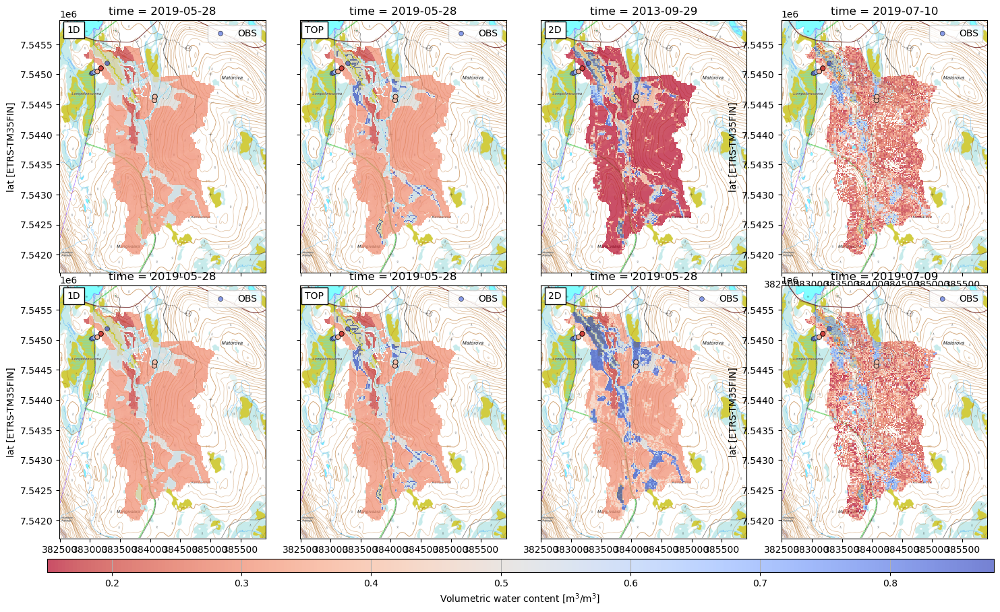

In [41]:
# SPAFHY AND SAR SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY
'''
start = np.where(pd.to_datetime(dates_spa) == '2019-05-01')[0][0]
end = np.where(pd.to_datetime(dates_spa) == '2019-09-01')[0][0]

d1 = '2019-05-28'
doi1 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d1)[0][0]
doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]
d2 = '2019-05-28'
doi2 = np.where(pd.to_datetime(dates_spa[start:end+1]) == d2)[0][0]
doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]

alp=0.7
ylims = [0.15,0.88]
fig = plt.figure(figsize=(18,10))
gs = fig.add_gridspec(2, 4)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax7 = fig.add_subplot(gs[0, 3])

ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])

rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = res_1d['bucket_moisture_root'][start:end][doi1].plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False, label='MOD')
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax1.legend()
rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im2 = res_top['bucket_moisture_root'][start:end][doi1].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax2.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3)

res_2d['bucket_moisture_root'][doi1].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax4.legend()
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax7)
sar_e['theta'][doi1].plot(ax=ax7, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d1,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax7, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax7.legend()
    
    
rasterio.plot.show(pk, transform=meta['transform'], ax=ax4);
im4 = res_1d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax4, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False, label='MOD')
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax4, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax4.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax5);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im5 = res_top['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax5, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax5, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax5.legend()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax6)

res_2d['bucket_moisture_root'][start:end+1][doi2].plot(ax=ax6, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
# TEST to see all locations
#theta_spat_gpd.loc[(theta_spat_gpd.index != d1) & (theta_spat_gpd.index != d2)][['theta', 'geometry']].plot(column='theta',
#                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
#                                              markersize=25,
#                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax6.legend()
                                              #theta_spat_gpd.loc[theta_spat_gpd.index == d][['SM_mean', 'geometry']].plot()

rasterio.plot.show(pk, transform=meta['transform'], ax=ax8)

sar_m['theta'][doi2].plot(ax=ax8, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                    add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d2,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax8, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=25,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
# TEST to see all locations
#theta_spat_gpd.loc[(theta_spat_gpd.index != d1) & (theta_spat_gpd.index != d2)][['theta', 'geometry']].plot(column='theta',
#                                               ax=ax6, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
#                                              markersize=25,
#                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax8.legend()    
    
    
props = dict(facecolor='white', alpha=1)

ax1.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)
ax2.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)
ax3.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)

ax4.text(0.07, 0.96,'1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax4.transAxes,
     bbox=props)
ax5.text(0.07, 0.96,'TOP', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax5.transAxes,
     bbox=props)
ax6.text(0.07, 0.96,'2D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax6.transAxes,
     bbox=props)

ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_ylabel('')
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')

ax1.axes.get_xaxis().set_ticklabels([])
ax1.set_xlabel('')
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_xlabel('')
ax3.axes.get_xaxis().set_ticklabels([])
ax3.set_xlabel('')

ax5.axes.get_yaxis().set_ticklabels([])
ax5.set_ylabel('')
ax6.axes.get_yaxis().set_ticklabels([])
ax6.set_ylabel('')

cax = plt.axes([0.12, 0.06, 0.78, 0.02])
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label(r'Volumetric water content [m$^3$/m$^3$]')

plt.subplots_adjust(wspace=0.1, hspace=0.05)


plt.savefig(f'spatial_models_2019_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_models__2019_{today}.png', bbox_inches='tight', dpi=300)
'''

C:\Users\janousu\AppData\Local\miniconda3\envs\spa\lib\site-packages\numpy\lib\nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
C:\Users\janousu\AppData\Local\miniconda3\envs\spa\lib\site-packages\numpy\lib\nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
C:\Users\janousu\AppData\Local\miniconda3\envs\spa\lib\site-packages\numpy\lib\nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
C:\Users\janousu\AppData\Local\miniconda3\envs\spa\lib\site-packages\numpy\lib\nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
C:\Users\janousu\AppData\Local\miniconda3\envs\spa\lib\site-packages\numpy\lib\nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1

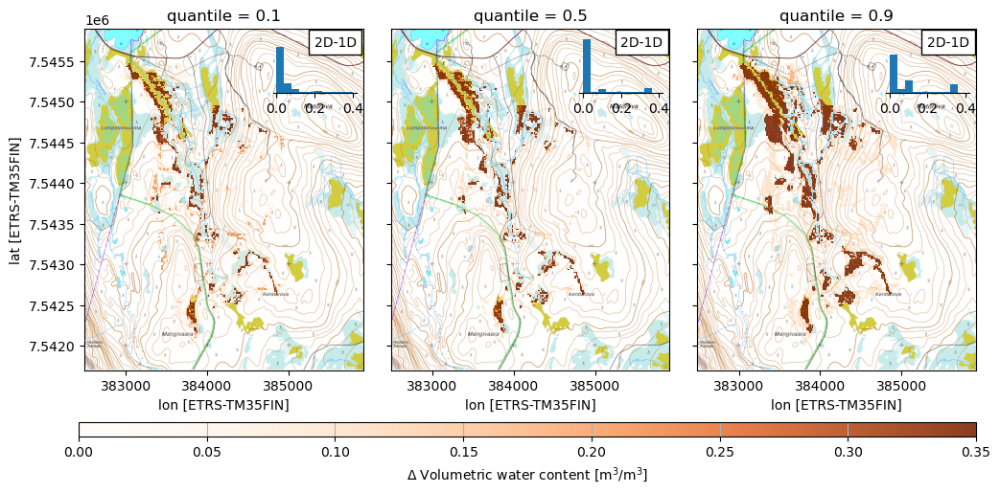

In [132]:
from matplotlib.colors import ListedColormap
import matplotlib.pylab as pl

lims = [0.00,0.4]
bins = 10

# SPAFHY SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY

#start = np.where(pd.to_datetime(dates_spa) == '2021-05-01')[0][0]
#end = np.where(pd.to_datetime(dates_spa) == '2021-09-02')[0][0]

#d1 = '2021-06-17'
#doi1 = np.where(pd.to_datetime(dates_spa[start:end]) == d1)[0][0]
#doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]
#d2 = '2021-09-01'
#doi2 = np.where(pd.to_datetime(dates_spa[start:end]) == d2)[0][0]
#doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]

median = res_2d['time'][np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).median().values)]
minim = res_2d['time'][np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).min().values)]
maxim = res_2d['time'][np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).max().values)]

# Choose colormap
cmap = pl.cm.Oranges

# Get the colormap colors
my_cmap = cmap(np.arange(cmap.N))

# Set alpha
my_cmap[:,-1] = np.linspace(0.2, 0.9, cmap.N)
# Create new colormap
my_cmap = ListedColormap(my_cmap)

alp=0.7
ylims = [0,0.35]
fig = plt.figure(figsize=(12,5))
gs = fig.add_gridspec(1, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])


rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = (res_2d['bucket_moisture_root'].quantile(0.1, dim='time')-res_1d['bucket_moisture_root'].quantile(0.1, dim='time')).plot(
    ax=ax1, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1], add_colorbar=False, label='2D-1D')

ix1 = inset_axes(ax1,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix1.hist((res_2d['bucket_moisture_root'].quantile(0.1, dim='time')-res_1d['bucket_moisture_root'].quantile(0.1, dim='time')).values.flatten()[~np.isnan((res_2d['bucket_moisture_root'].quantile(0.1, dim='time')-res_1d['bucket_moisture_root'].quantile(0.1, dim='time')).values.flatten())],
         bins=bins, range=lims)
ix1.patch.set_alpha(0.01)


rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im2 = (res_2d['bucket_moisture_root'].quantile(0.5, dim='time')-res_1d['bucket_moisture_root'].quantile(0.5, dim='time')).plot(
    ax=ax2, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1],  add_colorbar=False, label='2D-1D')

ix2 = inset_axes(ax2,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix2.hist((res_2d['bucket_moisture_root'].quantile(0.5, dim='time')-res_1d['bucket_moisture_root'].quantile(0.5, dim='time')).values.flatten()[~np.isnan((res_2d['bucket_moisture_root'].quantile(0.5, dim='time')-res_1d['bucket_moisture_root'].quantile(0.5, dim='time')).values.flatten())],
         bins=bins, range=lims)
ix2.patch.set_alpha(0.01)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3)
(res_2d['bucket_moisture_root'].quantile(0.9, dim='time')-res_1d['bucket_moisture_root'].quantile(0.9, dim='time')).plot(
    ax=ax3, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1], add_colorbar=False, label='2D-1D')
ix3 = inset_axes(ax3,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix3.hist((res_2d['bucket_moisture_root'].quantile(0.9, dim='time')-res_1d['bucket_moisture_root'].quantile(0.9, dim='time')).values.flatten()[~np.isnan((res_2d['bucket_moisture_root'].quantile(0.9, dim='time')-res_1d['bucket_moisture_root'].quantile(0.9, dim='time')).values.flatten())],
         bins=bins, range=lims)
ix3.patch.set_alpha(0.01)


props = dict(facecolor='white', alpha=1)


ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_ylabel('')
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')

#ax1.axes.get_xaxis().set_ticklabels([])
#ax1.set_xlabel('')
#ax2.axes.get_xaxis().set_ticklabels([])
#ax2.set_xlabel('')
#ax3.axes.get_xaxis().set_ticklabels([])
#ax3.set_xlabel('')
ax1.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)
ax2.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)
ax3.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)


ix1.axes.get_yaxis().set_ticklabels([])
ix2.axes.get_yaxis().set_ticklabels([])
ix3.axes.get_yaxis().set_ticklabels([])

ix1.set_yticks([])
ix2.set_yticks([])
ix3.set_yticks([])

ix1.set_xticks([])
ix2.set_xticks([])
ix3.set_xticks([])

ix1.set_ylim([0,12000])
ix2.set_ylim([0,12000])
ix3.set_ylim([0,12000])

ix1.set_xticks(np.arange(0.0,0.41,0.2))
ix2.set_xticks(np.arange(0.0,0.41,0.2))
ix3.set_xticks(np.arange(0.0,0.41,0.2))

ix1.spines[['right', 'top', 'left']].set_visible(False)
ix2.spines[['right', 'top', 'left']].set_visible(False)
ix3.spines[['right', 'top', 'left']].set_visible(False)

ix1.grid(False)
ix2.grid(False)
ix3.grid(False)

ix1.set_ylim(0,14000)
ix2.set_ylim(0,14000)
ix3.set_ylim(0,14000)

cax = plt.axes([0.12, 0, 0.78, 0.03])
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label(u'Δ Volumetric water content [m$^3$/m$^3$]')
#plt.title('SpaFHy-2D - SpaFHy-1D', y=2)
#fig.suptitle('SpaFHy-2D - SpaFHy-1D', fontsize=10)
plt.subplots_adjust(wspace=0.1, hspace=0)


plt.savefig(f'spatial_models_dif_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_models_dif_{today}.png', bbox_inches='tight', dpi=300)

In [59]:
'''
from matplotlib.colors import ListedColormap
import matplotlib.pylab as pl

# SPAFHY SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY

#start = np.where(pd.to_datetime(dates_spa) == '2021-05-01')[0][0]
#end = np.where(pd.to_datetime(dates_spa) == '2021-09-02')[0][0]

#d1 = '2021-06-17'
#doi1 = np.where(pd.to_datetime(dates_spa[start:end]) == d1)[0][0]
#doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]
#d2 = '2021-09-01'
#doi2 = np.where(pd.to_datetime(dates_spa[start:end]) == d2)[0][0]
#doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]

median = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).median().values)
minim = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).min().values)
maxim = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).max().values)

# Choose colormap
cmap = pl.cm.Oranges

# Get the colormap colors
my_cmap = cmap(np.arange(cmap.N))

# Set alpha
my_cmap[:,-1] = np.linspace(0, 1, cmap.N)
# Create new colormap
my_cmap = ListedColormap(my_cmap)

alp=0.7
ylims = [0,0.35]
fig = plt.figure(figsize=(12,5))
gs = fig.add_gridspec(1, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])


rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = ((res_2d['bucket_moisture_root'][minim])-(res_1d['bucket_moisture_root'][minim]))[0].plot(
    ax=ax1, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1], add_colorbar=False, label='2D-1D')

rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im2 = ((res_2d['bucket_moisture_root'][median])-(res_1d['bucket_moisture_root'][median]))[0].plot(
    ax=ax2, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1],  add_colorbar=False, label='2D-1D')

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3)

im3 = ((res_2d['bucket_moisture_root'][maxim])-(res_1d['bucket_moisture_root'][maxim]))[0].plot(
    ax=ax3, cmap=my_cmap, vmin=ylims[0], vmax=ylims[1], add_colorbar=False, label='2D-1D')

props = dict(facecolor='white', alpha=1)


ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_ylabel('')
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')

#ax1.axes.get_xaxis().set_ticklabels([])
#ax1.set_xlabel('')
#ax2.axes.get_xaxis().set_ticklabels([])
#ax2.set_xlabel('')
#ax3.axes.get_xaxis().set_ticklabels([])
#ax3.set_xlabel('')
ax1.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)
ax2.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)
ax3.text(0.9, 0.96,'2D-1D', size=10,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)

cax = plt.axes([0.12, 0, 0.78, 0.03])
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label(r'Volumetric water content [m$^3$/m$^3$]')
#plt.title('SpaFHy-2D - SpaFHy-1D', y=2)
#fig.suptitle('SpaFHy-2D - SpaFHy-1D', fontsize=10)
plt.subplots_adjust(wspace=0.1, hspace=0)


plt.savefig(f'spatial_models_dif_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_models_dif_{today}.png', bbox_inches='tight', dpi=300)
'''

"\nfrom matplotlib.colors import ListedColormap\nimport matplotlib.pylab as pl\n\n# SPAFHY SPATIAL MODEL VERSION COMPARISON WET AND DRY DAY\n\n#start = np.where(pd.to_datetime(dates_spa) == '2021-05-01')[0][0]\n#end = np.where(pd.to_datetime(dates_spa) == '2021-09-02')[0][0]\n\n#d1 = '2021-06-17'\n#doi1 = np.where(pd.to_datetime(dates_spa[start:end]) == d1)[0][0]\n#doi_m1 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d1)[0][0]\n#d2 = '2021-09-01'\n#doi2 = np.where(pd.to_datetime(dates_spa[start:end]) == d2)[0][0]\n#doi_m2 = np.where(pd.to_datetime(theta_spat['time'][:].data) == d2)[0][0]\n\nmedian = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).median().values)\nminim = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).min().values)\nmaxim = np.where(res_2d['bucket_moisture_root'].sum(dim=['lat', 'lon']).values == r

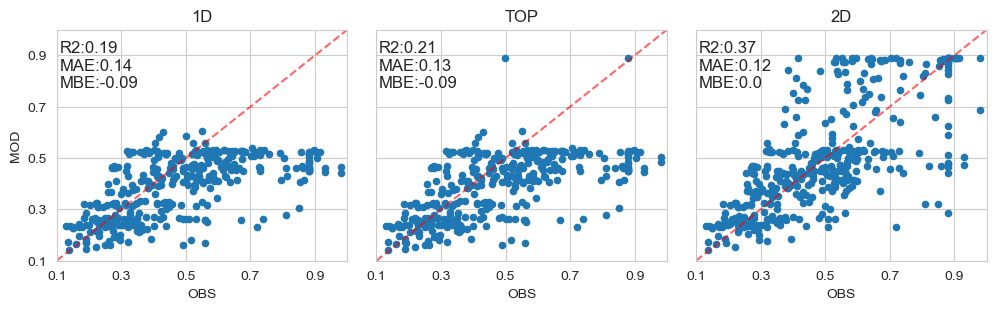

In [99]:
r2_spa_theta_1d = R2_metrics(spat_theta_pair, columns=['obs', 'mod_1d'])
r2_spa_theta_top =  R2_metrics(spat_theta_pair, columns=['obs', 'mod_top'])
r2_spa_theta_2d =  R2_metrics(spat_theta_pair, columns=['obs', 'mod_2d'])

mbe_spa_theta_1d = MBE_metrics(spat_theta_pair, columns=['obs', 'mod_1d'])
mbe_spa_theta_top =  MBE_metrics(spat_theta_pair, columns=['obs', 'mod_top'])
mbe_spa_theta_2d =  MBE_metrics(spat_theta_pair, columns=['obs', 'mod_2d'])

mae_spa_theta_1d = MAE_metrics(spat_theta_pair, columns=['obs', 'mod_1d'])
mae_spa_theta_top =  MAE_metrics(spat_theta_pair, columns=['obs', 'mod_top'])
mae_spa_theta_2d =  MAE_metrics(spat_theta_pair, columns=['obs', 'mod_2d'])

# SCATTERPLOTS OF SPATIAL SOIL MOISTURE MEASUREMENTS AND SIMULATIONS
alp=1.0
ms=20
ylims = [0.1,1.0]
text1 = [0.01, 0.75]

fig = plt.figure(figsize=(12,3))
gs = fig.add_gridspec(1, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

ax1.scatter(spat_theta_pair['obs'], spat_theta_pair['mod_1d'], alpha=alp, s=ms)
ax1.plot(ylims, ylims, 'r--', alpha=0.6)
ax2.scatter(spat_theta_pair['obs'], spat_theta_pair['mod_top'], alpha=alp, s=ms)
ax2.plot(ylims, ylims, 'r--', alpha=0.6)
ax3.scatter(spat_theta_pair['obs'], spat_theta_pair['mod_2d'], alpha=alp, s=ms)
ax3.plot(ylims, ylims, 'r--', alpha=0.6)

ax1.set_ylim(ylims)
ax1.set_xlim(ylims)
ax2.set_ylim(ylims)
ax2.set_xlim(ylims)
ax3.set_ylim(ylims)
ax3.set_xlim(ylims)

ax1.set_xlabel('OBS')
ax1.set_ylabel('MOD')
ax2.set_xlabel('OBS')
ax3.set_xlabel('OBS')

ax1.set_title('1D')
ax2.set_title('TOP')
ax3.set_title('2D')

ax1.text(text1[0], text1[1], f'R2:{r2_spa_theta_1d}\nMAE:{mae_spa_theta_1d}\nMBE:{mbe_spa_theta_1d}',
         fontsize=12, transform=ax1.transAxes)
ax2.text(text1[0], text1[1], f'R2:{r2_spa_theta_top}\nMAE:{mae_spa_theta_top}\nMBE:{mbe_spa_theta_top}',
         fontsize=12, transform=ax2.transAxes)
ax3.text(text1[0], text1[1], f'R2:{r2_spa_theta_2d}\nMAE:{mae_spa_theta_2d}\nMBE:{mbe_spa_theta_2d}',
         fontsize=12, transform=ax3.transAxes)

ax2.axes.get_yaxis().set_ticklabels([])
ax2.set_yticks([])
ax2.yaxis.set_ticks_position('none')

ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_yticks([])
ax3.yaxis.set_ticks_position('none')


ax1.set_xticks(np.arange(ylims[0], ylims[1], 0.2))
ax1.set_yticks(np.arange(ylims[0], ylims[1], 0.2))
ax2.set_xticks(np.arange(ylims[0], ylims[1], 0.2))
ax2.set_yticks(np.arange(ylims[0], ylims[1], 0.2))
ax3.set_xticks(np.arange(ylims[0], ylims[1], 0.2))
ax3.set_yticks(np.arange(ylims[0], ylims[1], 0.2))

plt.subplots_adjust(wspace=0.1, hspace=0)

plt.savefig(f'spatial_theta_scat_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'spatial_theta_scat_{today}.png', bbox_inches='tight', dpi=300)

In [168]:
# HISTOGRAMS

june_id = np.where(pd.to_datetime(dates_spa).month == 6)[0]
june_id_sar = np.where(pd.to_datetime(dates_sar_m).month == 6)[0]
june_id_sarmask = np.where((dates_spa.isin(dates_sar_m)) & (dates_spa.month == 6))[0]

july_id = np.where(pd.to_datetime(dates_spa).month == 7)[0]
july_id_sar = np.where(pd.to_datetime(dates_sar_m).month == 7)[0]
july_id_sarmask = np.where((dates_spa.isin(dates_sar_m)) & (dates_spa.month == 7))[0]

august_id = np.where(pd.to_datetime(dates_spa).month == 8)[0]
august_id_sar = np.where(pd.to_datetime(dates_sar_m).month == 8)[0]
august_id_sarmask = np.where((dates_spa.isin(dates_sar_m)) & (dates_spa.month == 8))[0]

sept_id = np.where(pd.to_datetime(dates_spa).month == 9)[0]
sept_id_sar = np.where(pd.to_datetime(dates_sar_m).month == 9)[0]
sept_id_sarmask = np.where((dates_spa.isin(dates_sar_m)) & (dates_spa.month == 9))[0]


top_moist_peat = np.array(res_top['bucket_moisture_root']).reshape(res_top['bucket_moisture_root'].shape[0], -1)[:,peat_id]
d2_moist_peat = np.array(res_2d['bucket_moisture_root']).reshape(res_2d['bucket_moisture_root'].shape[0], -1)[:,peat_id]
d1_moist_peat = np.array(res_1d['bucket_moisture_root']).reshape(res_1d['bucket_moisture_root'].shape[0], -1)[:,peat_id]
sar_moist_peat = np.array(sar_m['theta']).reshape(sar_m['theta'].shape[0], -1)[:,peat_id]
d2_sarmask_moist_peat = np.array(res_2d['bucket_moisture_root']*sar_mask).reshape(res_2d['bucket_moisture_root'].shape[0], -1)[:,peat_id]
d1_sarmask_moist_peat = np.array(res_1d['bucket_moisture_root']*sar_mask).reshape(res_1d['bucket_moisture_root'].shape[0], -1)[:,peat_id]
top_sarmask_moist_peat = np.array(res_top['bucket_moisture_root']*sar_mask).reshape(res_top['bucket_moisture_root'].shape[0], -1)[:,peat_id]


top_moist_mineral = np.array(res_top['bucket_moisture_root']).reshape(res_top['bucket_moisture_root'].shape[0], -1)[:,mineral_id]
d2_moist_mineral = np.array(res_2d['bucket_moisture_root']).reshape(res_2d['bucket_moisture_root'].shape[0], -1)[:,mineral_id]
d1_moist_mineral = np.array(res_1d['bucket_moisture_root']).reshape(res_1d['bucket_moisture_root'].shape[0], -1)[:,mineral_id]
sar_moist_mineral = np.array(sar_m['theta']).reshape(sar_m['theta'].shape[0], -1)[:,mineral_id]
d2_sarmask_moist_mineral = np.array(res_2d['bucket_moisture_root']*sar_mask).reshape(res_2d['bucket_moisture_root'].shape[0], -1)[:,mineral_id]
d1_sarmask_moist_mineral = np.array(res_1d['bucket_moisture_root']*sar_mask).reshape(res_1d['bucket_moisture_root'].shape[0], -1)[:,mineral_id]
top_sarmask_moist_mineral = np.array(res_top['bucket_moisture_root']*sar_mask).reshape(res_top['bucket_moisture_root'].shape[0], -1)[:,mineral_id]

alp=0.6
peat_lims = [0.1,0.9]
min_lims = [0.1,0.9]

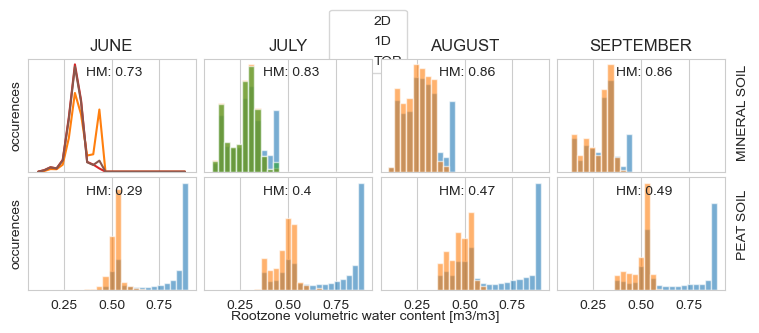

In [116]:
# HISTOGRAM PLOT
text1 = [0.35, 0.85]
alp=0.6
peat_lims = [0.1,0.9]
min_lims = [0.1,0.9]

fig = plt.figure(figsize=(9,3))
gs = fig.add_gridspec(2, 4)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])

ax5 = fig.add_subplot(gs[1, 0])
ax6 = fig.add_subplot(gs[1, 1])
ax7 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])

n,x,_ = ax1.hist(d2_moist_mineral[june_id].flatten(), bins=25, range=min_lims, alpha=alp-0.6, label='2D')
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n) ## using bin_centers rather than edges
n,x,_ = ax1.hist(d1_moist_mineral[june_id].flatten(), bins=25, range=min_lims, alpha=alp-0.6, label='1D')
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n) ## using bin_centers rather than edges
n,x,_ = ax1.hist(top_moist_mineral[june_id].flatten(), bins=25, edgecolor='black', range=min_lims, alpha=alp-0.6, label='TOP')
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n) ## using bin_centers rather than edges

ax1.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[june_id].flatten(),d1_moist_mineral[june_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax1.transAxes)
ax1.legend(ncol=1,bbox_to_anchor=(2.3,1.5))
ax1.set_title('JUNE')
ax1.set_ylabel('occurences')

ax2.hist(d2_moist_mineral[july_id].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax2.hist(d1_moist_mineral[july_id].flatten(), bins=25, range=min_lims, alpha=alp, label='1D')

ax2.set_title('JULY')
ax2.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[july_id].flatten(),d1_moist_mineral[july_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax2.transAxes)


ax3.hist(d2_moist_mineral[august_id].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax3.hist(d1_moist_mineral[august_id].flatten(), bins=25, range=min_lims, alpha=alp, label='1D')
ax3.set_title('AUGUST')
ax3.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[august_id].flatten(),d1_moist_mineral[august_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax3.transAxes)

ax4.hist(d2_moist_mineral[sept_id].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax4.hist(d1_moist_mineral[sept_id].flatten(), bins=25, range=min_lims, alpha=alp, label='1D')
ax4.set_title('SEPTEMBER')
ax4.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[sept_id].flatten(),d1_moist_mineral[sept_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax4.transAxes)

###
ax5.hist(d2_moist_peat[june_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax5.hist(d1_moist_peat[june_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='1D')
ax5.set_ylabel('occurences')
ax5.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[june_id].flatten(),d1_moist_peat[june_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax5.transAxes)


ax6.hist(d2_moist_peat[july_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax6.hist(d1_moist_peat[july_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='1D')
ax6.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[july_id].flatten(),d1_moist_peat[july_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax6.transAxes)


ax7.hist(d2_moist_peat[august_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax7.hist(d1_moist_peat[august_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='1D')
ax7.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[august_id].flatten(),d1_moist_peat[august_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax7.transAxes)


ax8.hist(d2_moist_peat[sept_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax8.hist(d1_moist_peat[sept_id].flatten(), bins=25, range=peat_lims, alpha=alp, label='1D')
ax8.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[sept_id].flatten(),d1_moist_peat[sept_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax8.transAxes)

ax1.axes.get_yaxis().set_ticklabels([])
ax1.set_yticks([])
ax2.set_yticks([])

ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])

ax2.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])
ax4.axes.get_yaxis().set_ticklabels([])
ax1.axes.get_xaxis().set_ticklabels([])
ax2.axes.get_xaxis().set_ticklabels([])
ax3.axes.get_xaxis().set_ticklabels([])
ax4.axes.get_xaxis().set_ticklabels([])

ax5.axes.get_yaxis().set_ticklabels([])
ax6.axes.get_yaxis().set_ticklabels([])
ax7.axes.get_yaxis().set_ticklabels([])
ax8.axes.get_yaxis().set_ticklabels([])

ax1.xaxis.set_ticks_position('none')
ax2.xaxis.set_ticks_position('none')
ax3.xaxis.set_ticks_position('none')
ax4.xaxis.set_ticks_position('none')

ax2.yaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax4.yaxis.set_ticks_position('none')
ax6.yaxis.set_ticks_position('none')
ax7.yaxis.set_ticks_position('none')
ax8.yaxis.set_ticks_position('none')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
fig.text(0.5, 0.01, 'Rootzone volumetric water content [m3/m3]', ha='center')

fig.text(0.92, 0.55, 'MINERAL SOIL', rotation='vertical', ha='center')
fig.text(0.92, 0.22, 'PEAT SOIL', rotation='vertical', ha='center')


plt.savefig(f'histogram_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'histogram_{today}.png', bbox_inches='tight', dpi=300)

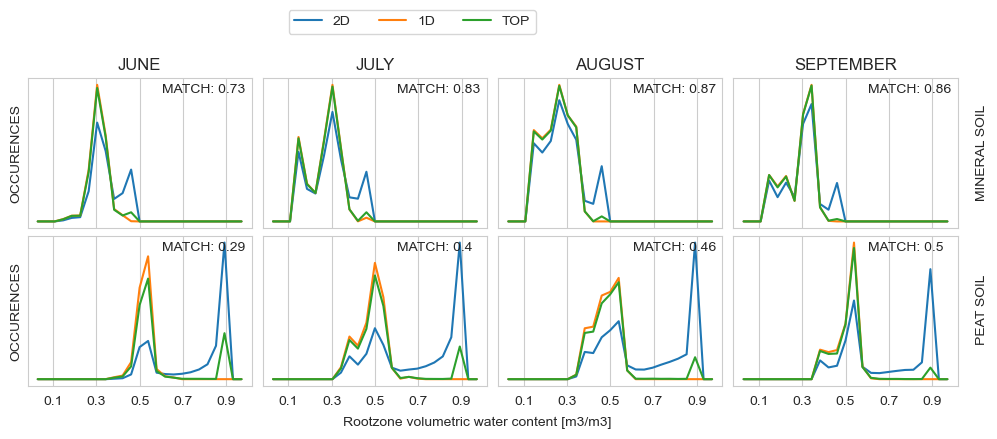

In [167]:
# HISTOGRAM PLOT
text1 = [0.6, 0.90]
alp=0.6
peat_lims = [0.01,0.99]
min_lims = [0.01,0.99]

fig = plt.figure(figsize=(12,4))
gs = fig.add_gridspec(2, 4)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])

ax5 = fig.add_subplot(gs[1, 0])
ax6 = fig.add_subplot(gs[1, 1])
ax7 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])

n,x, = np.histogram(d2_moist_mineral[june_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:blue', label='2D') ## using bin_centers rather than edges
n,x, = np.histogram(d1_moist_mineral[june_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:orange', label='1D') ## using bin_centers rather than edges
n,x, = np.histogram(top_moist_mineral[june_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:green', label='TOP') ## using bin_centers rather than edges

ax1.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[june_id].flatten(),d1_moist_mineral[june_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax1.transAxes)
ax1.legend(ncol=3,bbox_to_anchor=(2.3,1.5))
ax1.set_title('JUNE')
ax1.set_ylabel('OCCURENCES')

n,x, = np.histogram(d2_moist_mineral[july_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_mineral[july_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:orange')
n,x, = np.histogram(top_moist_mineral[july_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:green')
ax2.set_title('JULY')
ax2.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[july_id].flatten(),d1_moist_mineral[july_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax2.transAxes)


n,x, = np.histogram(d2_moist_mineral[august_id].flatten(),bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_mineral[august_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_mineral[august_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:green') 
ax3.set_title('AUGUST')
ax3.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[august_id].flatten(),d1_moist_mineral[august_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax3.transAxes)

n,x, = np.histogram(d2_moist_mineral[sept_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_mineral[sept_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_mineral[sept_id].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:green') 
ax4.set_title('SEPTEMBER')
ax4.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[sept_id].flatten(),d1_moist_mineral[sept_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax4.transAxes)

###
n,x, = np.histogram(d2_moist_peat[june_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_peat[june_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_peat[june_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:green') 
ax5.set_ylabel('OCCURENCES')
ax5.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[june_id].flatten(),d1_moist_peat[june_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax5.transAxes)

n,x, = np.histogram(d2_moist_peat[july_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_peat[july_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_peat[july_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:green') 
ax6.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[july_id].flatten(),d1_moist_peat[july_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax6.transAxes)

n,x, = np.histogram(d2_moist_peat[august_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_peat[august_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_peat[august_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:green')                  
ax7.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[august_id].flatten(),d1_moist_peat[august_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax7.transAxes)


n,x, = np.histogram(d2_moist_peat[sept_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_moist_peat[sept_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_moist_peat[sept_id].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:green') 

ax8.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[sept_id].flatten(),d1_moist_peat[sept_id].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax8.transAxes)

ax1.axes.get_yaxis().set_ticklabels([])
ax1.set_yticks([])
ax2.set_yticks([])

ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])

ax2.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])
ax4.axes.get_yaxis().set_ticklabels([])
ax1.axes.get_xaxis().set_ticklabels([])
ax2.axes.get_xaxis().set_ticklabels([])
ax3.axes.get_xaxis().set_ticklabels([])
ax4.axes.get_xaxis().set_ticklabels([])

ax5.axes.get_yaxis().set_ticklabels([])
ax6.axes.get_yaxis().set_ticklabels([])
ax7.axes.get_yaxis().set_ticklabels([])
ax8.axes.get_yaxis().set_ticklabels([])

ax1.xaxis.set_ticks_position('none')
ax2.xaxis.set_ticks_position('none')
ax3.xaxis.set_ticks_position('none')
ax4.xaxis.set_ticks_position('none')

ax2.yaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax4.yaxis.set_ticks_position('none')
ax6.yaxis.set_ticks_position('none')
ax7.yaxis.set_ticks_position('none')
ax8.yaxis.set_ticks_position('none')


ax1.set_xticks(np.arange(0.1,1.0,0.2))
ax2.set_xticks(np.arange(0.1,1.0,0.2))
ax3.set_xticks(np.arange(0.1,1.0,0.2))
ax4.set_xticks(np.arange(0.1,1.0,0.2))
ax5.set_xticks(np.arange(0.1,1.0,0.2))
ax6.set_xticks(np.arange(0.1,1.0,0.2))
ax7.set_xticks(np.arange(0.1,1.0,0.2))
ax8.set_xticks(np.arange(0.1,1.0,0.2))

plt.subplots_adjust(wspace=0.05, hspace=0.05)
fig.text(0.5, 0.01, 'Rootzone volumetric water content [m3/m3]', ha='center')

fig.text(0.92, 0.58, 'MINERAL SOIL', rotation='vertical', ha='center')
fig.text(0.92, 0.22, 'PEAT SOIL', rotation='vertical', ha='center')

plt.savefig(f'histogram_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'histogram_{today}.png', bbox_inches='tight', dpi=300)

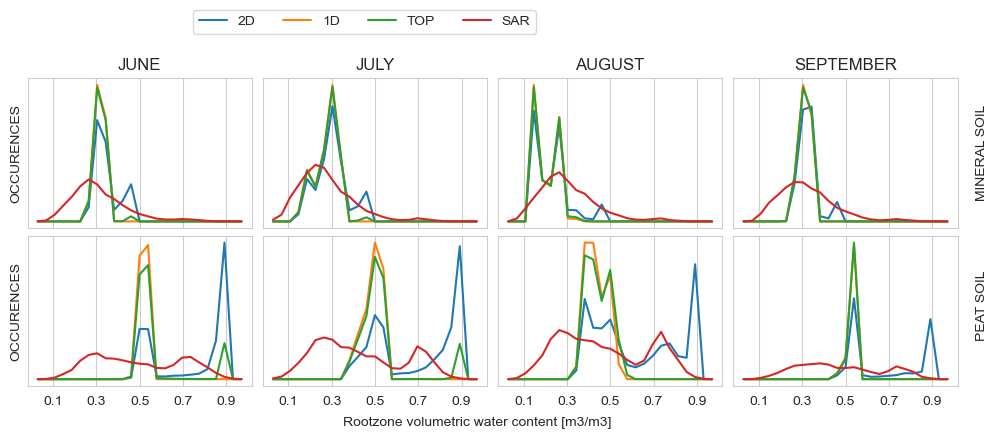

In [212]:
# HISTOGRAM PLOT
text1 = [0.6, 0.90]
alp=0.6
peat_lims = [0.01,0.99]
min_lims = [0.01,0.99]

fig = plt.figure(figsize=(12,4))
gs = fig.add_gridspec(2, 4)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])

ax5 = fig.add_subplot(gs[1, 0])
ax6 = fig.add_subplot(gs[1, 1])
ax7 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])

n,x, = np.histogram(d2_sarmask_moist_mineral[june_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:blue', label='2D') ## using bin_centers rather than edges
n,x, = np.histogram(d1_sarmask_moist_mineral[june_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:orange', label='1D') ## using bin_centers rather than edges
n,x, = np.histogram(top_sarmask_moist_mineral[june_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:green', label='TOP') ## using bin_centers rather than edges
n,x, = np.histogram(sar_moist_mineral[june_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax1.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
#ax1.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[june_id].flatten(),d1_moist_mineral[june_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax1.transAxes)
ax1.legend(ncol=4,bbox_to_anchor=(2.3,1.5))
ax1.set_title('JUNE')
ax1.set_ylabel('OCCURENCES')

n,x, = np.histogram(d2_sarmask_moist_mineral[july_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_mineral[july_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:orange')
n,x, = np.histogram(top_sarmask_moist_mineral[july_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:green')
n,x, = np.histogram(sar_moist_mineral[july_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax2.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
ax2.set_title('JULY')
#ax2.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[july_id].flatten(),d1_moist_mineral[july_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax2.transAxes)


n,x, = np.histogram(d2_sarmask_moist_mineral[august_id_sarmask].flatten(),bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_mineral[august_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_mineral[august_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:green') 
n,x, = np.histogram(sar_moist_mineral[august_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax3.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
ax3.set_title('AUGUST')
#ax3.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[august_id].flatten(),d1_moist_mineral[august_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax3.transAxes)

n,x, = np.histogram(d2_sarmask_moist_mineral[sept_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_mineral[sept_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_mineral[sept_id_sarmask].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:green') 
n,x, = np.histogram(sar_moist_mineral[sept_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax4.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
ax4.set_title('SEPTEMBER')
#ax4.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_mineral[sept_id].flatten(),d1_moist_mineral[sept_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax4.transAxes)

###
n,x, = np.histogram(d2_sarmask_moist_peat[june_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_peat[june_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_peat[june_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:green') 
n,x, = np.histogram(sar_moist_peat[june_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax5.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
ax5.set_ylabel('OCCURENCES')
#ax5.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[june_id].flatten(),d1_moist_peat[june_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax5.transAxes)

n,x, = np.histogram(d2_sarmask_moist_peat[july_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_peat[july_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_peat[july_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:green') 
n,x, = np.histogram(sar_moist_peat[july_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax6.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
#ax6.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[july_id].flatten(),d1_moist_peat[july_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax6.transAxes)

n,x, = np.histogram(d2_sarmask_moist_peat[august_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_peat[august_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_peat[august_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:green')     
n,x, = np.histogram(sar_moist_peat[august_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax7.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
#ax7.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[august_id].flatten(),d1_moist_peat[august_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax7.transAxes)


n,x, = np.histogram(d2_sarmask_moist_peat[sept_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:blue') 
n,x, = np.histogram(d1_sarmask_moist_peat[sept_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:orange') 
n,x, = np.histogram(top_sarmask_moist_peat[sept_id_sarmask].flatten(), bins=25, range=peat_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:green') 
n,x, = np.histogram(sar_moist_peat[sept_id_sar].flatten(), bins=25, range=min_lims)
bin_centers = 0.5*(x[1:]+x[:-1])
ax8.plot(bin_centers,n, color='tab:red', label='SAR') ## using bin_centers rather than edges
#ax8.text(text1[0], text1[1], f'MATCH: {histogram_match(d2_moist_peat[sept_id].flatten(),d1_moist_peat[sept_id].flatten(), bins=25, lims=min_lims)}',
#         fontsize=10, transform=ax8.transAxes)

ax1.axes.get_yaxis().set_ticklabels([])
ax1.set_yticks([])
ax2.set_yticks([])

ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])

ax2.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])
ax4.axes.get_yaxis().set_ticklabels([])
ax1.axes.get_xaxis().set_ticklabels([])
ax2.axes.get_xaxis().set_ticklabels([])
ax3.axes.get_xaxis().set_ticklabels([])
ax4.axes.get_xaxis().set_ticklabels([])

ax5.axes.get_yaxis().set_ticklabels([])
ax6.axes.get_yaxis().set_ticklabels([])
ax7.axes.get_yaxis().set_ticklabels([])
ax8.axes.get_yaxis().set_ticklabels([])

ax1.xaxis.set_ticks_position('none')
ax2.xaxis.set_ticks_position('none')
ax3.xaxis.set_ticks_position('none')
ax4.xaxis.set_ticks_position('none')

ax2.yaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax4.yaxis.set_ticks_position('none')
ax6.yaxis.set_ticks_position('none')
ax7.yaxis.set_ticks_position('none')
ax8.yaxis.set_ticks_position('none')

ax1.set_xticks(np.arange(0.1,1.0,0.2))
ax2.set_xticks(np.arange(0.1,1.0,0.2))
ax3.set_xticks(np.arange(0.1,1.0,0.2))
ax4.set_xticks(np.arange(0.1,1.0,0.2))
ax5.set_xticks(np.arange(0.1,1.0,0.2))
ax6.set_xticks(np.arange(0.1,1.0,0.2))
ax7.set_xticks(np.arange(0.1,1.0,0.2))
ax8.set_xticks(np.arange(0.1,1.0,0.2))

plt.subplots_adjust(wspace=0.05, hspace=0.05)
fig.text(0.5, 0.01, 'Rootzone volumetric water content [m3/m3]', ha='center')

fig.text(0.92, 0.58, 'MINERAL SOIL', rotation='vertical', ha='center')
fig.text(0.92, 0.23, 'PEAT SOIL', rotation='vertical', ha='center')

plt.savefig(f'histogram_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'histogram_{today}.png', bbox_inches='tight', dpi=300)

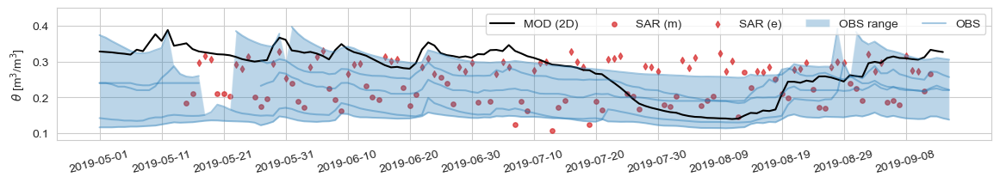

In [ ]:
# temporal sar model obs

# SAR SPATIAL PLOTS
start_day = pd.to_datetime('2019-05-01')
end_day = pd.to_datetime('2019-09-15')

start = np.where(pd.to_datetime(dates_spa) == start_day)[0][0]
end = np.where(pd.to_datetime(dates_spa) == end_day)[0][0]


window = pd.date_range(start_day, end_day, freq='D')

window_sar = window[window.isin(dates_sar_m)]

alp=0.5
ylims = [0.2,0.88]
ylimstemp = [0.08,0.45]
fig = plt.figure(figsize=(14,2))
gs = fig.add_gridspec(1, 1)

ax0 = fig.add_subplot(gs[0, 0])

#ax0.plot(dates_spa[start:end], np.nanmean(res_2d['bucket_moisture_root'][start:end], axis=(1,2)), linewidth=2, color='black', label='mean')
ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_root'][start:end, ht[0], ht[1]], linewidth=1.5, color='black', label='MOD (2D)')
#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='black', label='2D rootzone')

#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='green', label='2D topsoil')

#ax0.fill_between(dates_spa[start:end], np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.8, axis=(1,2)),
#                      np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.2, axis=(1,2)), alpha=0.3, label='20-quantile')

#ax0.scatter(pd.to_datetime(sar_temp['time'][:].data), np.nanmean(sar_temp['theta'], axis=(1,2)), s=50, color='red', label='SAR')
ax0.scatter(pd.to_datetime(sar_m['time'][:].data), sar_m['theta'][:,ht[0], ht[1]], marker='o', s=15, alpha=0.7, color='tab:red', label='SAR (m)')
#ax0.plot(pd.to_datetime(sar_m['time'][:].data[4:]),
#        sar_m['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='tab:red', alpha=0.5, label='SAR rolling mean')

ax0.scatter(pd.to_datetime(sar_e['time'][:].data), sar_e['theta'][:,ht[0], ht[1]], s=15, color='tab:red', marker='d', alpha=0.7, label='SAR (e)')
#ax0.plot(pd.to_datetime(sar_e['time'][:].data[4:]),
#         sar_e['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='tab:red', alpha=0.5)
#ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'mean_obs'], alpha=0.8, label='OBS mean')
ax0.fill_between(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'min'],
                      theta.loc[theta[start_day:end_day].index, 'max'], alpha=0.3, label='OBS range')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's3'], alpha=0.4, color='tab:blue', label='OBS')
#ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's5'], alpha=0.8, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's18'], alpha=0.4, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-5A'], alpha=0.4, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-5B'], alpha=0.4, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-20A'], alpha=0.4, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-20B'], alpha=0.4, color='tab:blue')

ax0.legend(ncol=5)#,bbox_to_anchor=(0.9,1.3))
#ax1.text(dates_spa[start:end][0], 0.2, 'a')
#ax0.xaxis.set_tick_params(rotation=15)
ax0.set_ylim(ylimstemp)

ax0.xaxis.set_tick_params(rotation=15)
ax0.set_xticks(pd.date_range(start_day, end_day, freq='10D'))

ax0.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')


plt.savefig(f'sar_spa_temp_single_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'sar_spa_temp_single_{today}.png', bbox_inches='tight', dpi=300)

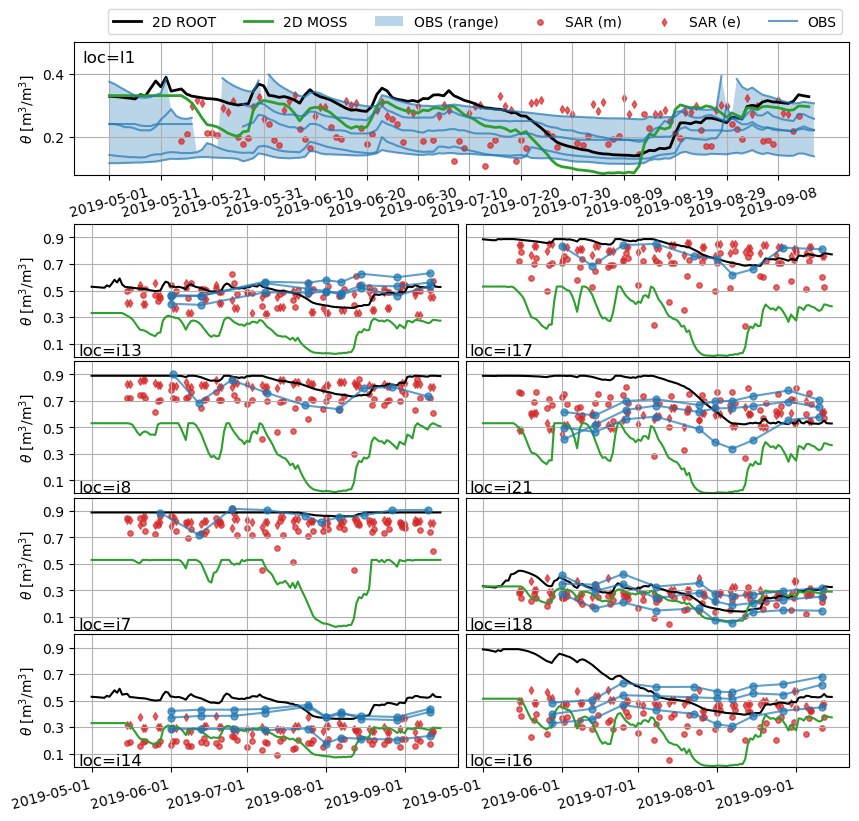

In [55]:
# temporal sar model obs

# SAR SPATIAL PLOTS
start_day = pd.to_datetime('2019-05-01')
end_day = pd.to_datetime('2019-09-15')
window = pd.date_range(start_day, end_day, freq='D')

window_sar = window[window.isin(dates_sar_m)]

start = np.where(pd.to_datetime(dates_spa) == start_day)[0][0]
end = np.where(pd.to_datetime(dates_spa) == end_day)[0][0]

alp=0.5
meas_depth=10

text1 = [0.01, 0.01]

ylims = [0.2,0.88]
ylimstemp = [0.08,0.5]
fig = plt.figure(figsize=(10,12))
gs = fig.add_gridspec(18, 2)

ax0 = fig.add_subplot(gs[0:3, :])
ax1 = fig.add_subplot(gs[4:7, 0])
ax2 = fig.add_subplot(gs[4:7, 1])
ax3 = fig.add_subplot(gs[7:10, 0])
ax4 = fig.add_subplot(gs[7:10, 1])
ax5 = fig.add_subplot(gs[10:13, 0])
ax6 = fig.add_subplot(gs[10:13, 1])
ax7 = fig.add_subplot(gs[13:16, 0])
ax8 = fig.add_subplot(gs[13:16, 1])

#ax0.plot(dates_spa[start:end], np.nanmean(res_2d['bucket_moisture_root'][start:end], axis=(1,2)), linewidth=2, color='black', label='mean')
ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_root'][start:end, ht[0], ht[1]], linewidth=2, color='black', label='2D ROOT')
ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='tab:green', label='2D MOSS')

ax0.fill_between(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'min'],
                      theta.loc[theta[start_day:end_day].index, 'max'], alpha=0.3, label='OBS (range)')
#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='black', label='2D rootzone')

#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='green', label='2D topsoil')

#ax0.fill_between(dates_spa[start:end], np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.8, axis=(1,2)),
#                      np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.2, axis=(1,2)), alpha=0.3, label='20-quantile')

#ax0.scatter(pd.to_datetime(sar_temp['time'][:].data), np.nanmean(sar_temp['theta'], axis=(1,2)), s=50, color='red', label='SAR')
ax0.scatter(pd.to_datetime(sar_m['time'][:].data), sar_m['theta'][:,ht[0], ht[1]], marker='o', s=15, alpha=0.7, color='tab:red', label='SAR (m)')
#ax0.plot(pd.to_datetime(sar_m['time'][:].data[4:]),
#         sar_m['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='tab:red', alpha=0.5, label='SAR rolling mean')

ax0.scatter(pd.to_datetime(sar_e['time'][:].data), sar_e['theta'][:,ht[0], ht[1]], s=15, color='tab:red', marker='d', alpha=0.7, label='SAR (e)')
#ax0.plot(pd.to_datetime(sar_e['time'][:].data[4:]),
#         sar_e['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='tab:red', alpha=0.5)
#ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'mean_obs'], alpha=0.8, label='OBS mean')
#ax0.fill_between(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'min'],
#                      theta.loc[theta[start_day:end_day].index, 'max'], alpha=0.4, label='OBS range')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's3'], alpha=0.7, color='tab:blue', label='OBS')
#ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's5'], alpha=0.8, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 's18'], alpha=0.7, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-5A'], alpha=0.7, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-5B'], alpha=0.7, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-20A'], alpha=0.7, color='tab:blue')
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'SH-20B'], alpha=0.7, color='tab:blue')
ax0.text(0.01, 0.85, 'loc=l1',
         fontsize=12, transform=ax0.transAxes)

ax0.legend(ncol=6,bbox_to_anchor=(1.0,1.3))
#ax1.text(dates_spa[start:end][0], 0.2, 'a')
#ax0.xaxis.set_tick_params(rotation=15)
ax0.set_ylim(ylimstemp)

# ax1
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].x[0], time=window, method='nearest').plot(
        ax=ax1, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].x[0], time=window, method='nearest').plot(
        ax=ax1, color='tab:green')

ax1.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax1.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)
ax1.text(text1[0], text1[1], 'loc=i13',
         fontsize=12, transform=ax1.transAxes)
#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i13', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax1, color='tab:red', alpha=0.7)
'''
ax1.fill_between()

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta']
'''
'''
theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, color='tab:blue')
'''
theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, marker='o', markersize=5, color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, marker='o', markersize=5, color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i13') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax1, alpha=0.7, marker='o', markersize=5, color='tab:blue')

# ax2
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax2, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax2, color='tab:green')

ax2.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax2.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i17', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i15', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i15', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax2, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i17') &
                   (theta_spat_gpd['z'] == 0) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax2, alpha=0.7, marker='o', markersize=5, color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i17') &
#                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax2, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i17') &
#                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax2, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

ax2.text(text1[0], text1[1], 'loc=i17',
         fontsize=12, transform=ax2.transAxes)

# ax3
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax3, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax3, color='tab:green')

ax3.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax3.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i8', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i20', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i20', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax3, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i8') &
                   (theta_spat_gpd['z'] == 0) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax3, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i8') &
#                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax3, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i8') &
#                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax3, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

ax3.text(text1[0], text1[1], 'loc=i8',
         fontsize=12, transform=ax3.transAxes)

# ax4
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax4, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax4, color='tab:green')

ax4.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax4.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i21', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax4, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i21') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax4, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i21') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax4, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i21') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax4, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

ax4.text(text1[0], text1[1], 'loc=i21',
         fontsize=12, transform=ax4.transAxes)

# ax5
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax5, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax5, color='tab:green')

ax5.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax5.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i7', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i22', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i22', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax5, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i7') &
                   (theta_spat_gpd['z'] == 0) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax5, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i7') &
#                   (theta_spat_gpd['z'] == 0) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax5, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

#theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i7') &
#                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
#                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax5, alpha=0.7, marker='o', markersize=5,  color='tab:blue')
ax5.text(text1[0], text1[1], 'loc=i7',
         fontsize=12, transform=ax5.transAxes)

# ax6
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax6, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax6, color='tab:green')

ax6.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax6.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i18', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax6, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i18') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax6, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i18') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax6,  alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i18') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax6,  alpha=0.7, marker='o', markersize=5,  color='tab:blue')

ax6.text(text1[0], text1[1], 'loc=i18',
         fontsize=12, transform=ax6.transAxes)

# ax7
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax7, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax7, color='tab:green')

ax7.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax7.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i14', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax7, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i14') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax7, alpha=0.7, marker='o', markersize=5,   color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i14') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax7, alpha=0.7, marker='o', markersize=5,   color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i14') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax7, alpha=0.7, marker='o', markersize=5,   color='tab:blue')

ax7.text(text1[0], text1[1], 'loc=i14',
         fontsize=12, transform=ax7.transAxes)
# ax8
res_2d['bucket_moisture_root'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax8, color='black')

res_2d['bucket_moisture_top'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].x[0],
    time=window, method='nearest').plot(ax=ax8, color='tab:green')

ax8.scatter(window_sar, sar_m['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', alpha=0.7, s=15)

ax8.scatter(window_sar, sar_e['theta'].sel(
    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].y[0],
    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].x[0], time=window_sar, method='nearest'),
    color='tab:red', marker='d', alpha=0.7, s=15)

#sar_m['theta'].sel(
#    lat=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].y[0],
#    lon=theta_spat_gpd.loc[theta_spat_gpd['ID_i'] == 'i16', 'geometry'].x[0],
#    time=window, method='nearest').rolling(time=5, center=True).mean().plot(ax=ax8, color='tab:red', alpha=0.7)

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i16') &
                   (theta_spat_gpd['z'] == meas_depth) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax8, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i16') &
                   (theta_spat_gpd['z'] == 20) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax8, alpha=0.7, marker='o', markersize=5,  color='tab:blue')

theta_spat_gpd.loc[(theta_spat_gpd['ID_i'] == 'i16') &
                   (theta_spat_gpd['z'] == 30) & (theta_spat_gpd.index >= start_day) &
                   (theta_spat_gpd.index <= end_day), 'theta'].plot(ax=ax8, alpha=0.7, marker='o', markersize=5,  color='tab:blue')
ax8.text(text1[0], text1[1], 'loc=i16',
         fontsize=12, transform=ax8.transAxes)

#ax0.xaxis.set_ticks_position('none')

ax1.axes.xaxis.set_ticklabels([])
ax1.xaxis.set_ticks_position('none')

ax2.axes.xaxis.set_ticklabels([])
ax2.xaxis.set_ticks_position('none')

ax3.axes.xaxis.set_ticklabels([])
ax3.xaxis.set_ticks_position('none')

ax4.axes.xaxis.set_ticklabels([])
ax4.xaxis.set_ticks_position('none')

ax5.axes.xaxis.set_ticklabels([])
ax5.xaxis.set_ticks_position('none')

ax6.axes.xaxis.set_ticklabels([])
ax6.xaxis.set_ticks_position('none')


ax2.axes.yaxis.set_ticklabels([])
ax2.yaxis.set_ticks_position('none')

ax4.axes.yaxis.set_ticklabels([])
ax4.yaxis.set_ticks_position('none')

ax6.axes.yaxis.set_ticklabels([])
ax6.yaxis.set_ticks_position('none')

ax8.axes.yaxis.set_ticklabels([])
ax8.yaxis.set_ticks_position('none')


ax2.set_ylabel('')
ax4.set_ylabel('')
ax6.set_ylabel('')
ax8.set_ylabel('')

ax1.set_ylim([0.0,1.0])
ax2.set_ylim([0.0,1.0])
ax3.set_ylim([0.0,1.0])
ax4.set_ylim([0.0,1.0])
ax5.set_ylim([0.0,1.0])
ax6.set_ylim([0.0,1.0])
ax7.set_ylim([0.0,1.0])
ax8.set_ylim([0.0,1.0])

ax1.set_yticks(np.arange(0.1,1,0.2))
ax2.set_yticks(np.arange(0.1,1,0.2))
ax3.set_yticks(np.arange(0.1,1,0.2))
ax4.set_yticks(np.arange(0.1,1,0.2))
ax5.set_yticks(np.arange(0.1,1,0.2))
ax6.set_yticks(np.arange(0.1,1,0.2))
ax7.set_yticks(np.arange(0.1,1,0.2))
ax8.set_yticks(np.arange(0.1,1,0.2))


ax1.set_title('')
ax2.set_title('')
ax3.set_title('')
ax4.set_title('')
ax5.set_title('')
ax6.set_title('')
ax7.set_title('')
ax8.set_title('')

ax1.set_xlabel('')
ax2.set_xlabel('')
ax3.set_xlabel('')
ax4.set_xlabel('')
ax5.set_xlabel('')
ax6.set_xlabel('')
ax7.set_xlabel('')
ax8.set_xlabel('')

ax0.set_xticks(pd.date_range(start_day, end_day, freq='10D'))
ax1.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax2.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax3.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax4.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax5.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax6.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax7.set_xticks(pd.date_range(start_day, end_day, freq='MS'))
ax8.set_xticks(pd.date_range(start_day, end_day, freq='MS'))

ax0.xaxis.set_tick_params(rotation=15)
ax7.xaxis.set_tick_params(rotation=15)
ax8.xaxis.set_tick_params(rotation=15)

ax0.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')
ax1.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')
ax3.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')
ax5.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')
ax7.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')

plt.subplots_adjust(wspace=0.02, hspace=0.1)

plt.savefig(f'sar_spa_temp_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'sar_spa_temp_{today}.png', bbox_inches='tight', dpi=300)

C:\Users\janousu\AppData\Local\Temp\ipykernel_25532\2264971738.py:80: UserWarning: Legend does not support handles for QuadMesh instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax1.legend()


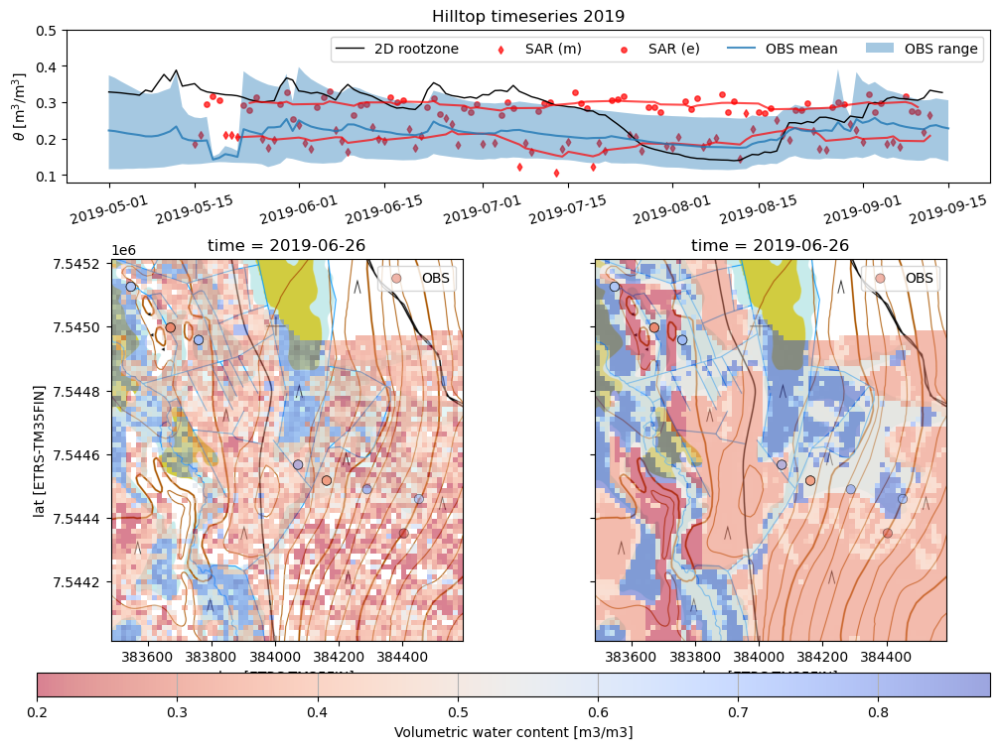

In [44]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

# SAR SPATIAL PLOTS
start_day = pd.to_datetime('2019-05-01')
end_day = pd.to_datetime('2019-09-15')

start = np.where(pd.to_datetime(dates_spa) == start_day)[0][0]
end = np.where(pd.to_datetime(dates_spa) == end_day)[0][0]

sar_wet_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).max())
sar_dry_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).min())

wet_day = pd.to_datetime(sar_m['time'][sar_wet_day].data[0])
dry_day = pd.to_datetime(sar_m['time'][sar_dry_day].data[0])

doi = np.where(pd.to_datetime(dates_spa[start:end]) == wet_day)[0][0]
d = pd.to_datetime(wet_day)

d = pd.to_datetime(pd.to_datetime('2019-06-26'))
doi = np.where(pd.to_datetime(dates_spa[start:end]) == '2019-06-26')[0][0]

bbox = [7.5452e6, 7.5440e6, 383500, 384600]
bbox_id = [np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[0]))[0][0],
           np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[1]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[2]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[3]))[0][0]]

alp=0.5
ylims = [0.2,0.88]
ylimstemp = [0.08,0.5]
fig = plt.figure(figsize=(12,8))
gs = fig.add_gridspec(3, 2)

ax0 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1:, 0])
ax1 = fig.add_subplot(gs[1:, 1])
#ax3 = fig.add_subplot(gs[1:, 2])

#ax0.plot(dates_spa[start:end], np.nanmean(res_2d['bucket_moisture_root'][start:end], axis=(1,2)), linewidth=2, color='black', label='mean')
ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_root'][start:end, ht[0], ht[1]], linewidth=1, color='black', label='2D rootzone')
#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='black', label='2D rootzone')

#ax0.plot(dates_spa[start:end], res_2d['bucket_moisture_top'][start:end, ht[0], ht[1]], linewidth=2, color='green', label='2D topsoil')

#ax0.fill_between(dates_spa[start:end], np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.8, axis=(1,2)),
#                      np.nanquantile(res_2d['bucket_moisture_root'][start:end], 0.2, axis=(1,2)), alpha=0.3, label='20-quantile')

#ax0.scatter(pd.to_datetime(sar_temp['time'][:].data), np.nanmean(sar_temp['theta'], axis=(1,2)), s=50, color='red', label='SAR')
ax0.scatter(pd.to_datetime(sar_m['time'][:].data), sar_m['theta'][:,ht[0], ht[1]], marker='d', s=15, alpha=0.7, color='red', label='SAR (m)')
ax0.plot(pd.to_datetime(sar_m['time'][:].data[4:]),
         sar_m['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='red', alpha=0.7)
#ax0.plot(dates_sar_m, sar_m['theta'][:,ht[0], ht[1]], color='red', alpha=0.7, label='SAR')
ax0.scatter(pd.to_datetime(sar_e['time'][:].data), sar_e['theta'][:,ht[0], ht[1]], s=15, color='red', alpha=0.7, label='SAR (e)')
ax0.plot(pd.to_datetime(sar_e['time'][:].data[4:]),
         sar_e['theta'][:,ht[0], ht[1]].rolling(time=5, center=True).mean().dropna("time"), color='red', alpha=0.7)
ax0.plot(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'mean_obs'], alpha=0.8, label='OBS mean')
ax0.fill_between(theta[start_day:end_day].index, theta.loc[theta[start_day:end_day].index, 'min'],
                      theta.loc[theta[start_day:end_day].index, 'max'], alpha=0.4, label='OBS range')
ax0.legend(ncol=5)
ax0.set_title('Hilltop timeseries 2019')
ax0.set_ylabel(r'$\theta$ [m$^3$/m$^3$]')
#ax1.text(dates_spa[start:end][0], 0.2, 'a')
ax0.grid()
ax0.xaxis.set_tick_params(rotation=15)
ax0.set_ylim(ylimstemp)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = res_2d['bucket_moisture_root'][start:end][doi][bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False, label='2D root')

theta_spat_gpd.loc[theta_spat_gpd.index == d,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=45,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax1.legend()
rasterio.plot.show(pk, transform=meta['transform'], ax=ax2);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im2 = sar_m['theta'].sel(time=d)[bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[theta_spat_gpd.index == d,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=45,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax2.legend()
ax1.axes.get_yaxis().set_ticklabels([])
ax1.set_ylabel('')

'''
rasterio.plot.show(pk, transform=meta['transform'], ax=ax3);
im3 = res_2d['bucket_moisture_top'][start:end][doi][bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False, label='2D')
theta_spat_gpd.loc[theta_spat_gpd.index == d,
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=0.5,
                                               markersize=35,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax3.legend()
ax3.axes.get_yaxis().set_ticklabels([])
ax3.set_ylabel('')
'''

cax = plt.axes([0.1, 0.04, 0.8, 0.03]) # 4-tuple of floats rect = [left, bottom, width, height]. A new axes is added
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label('Volumetric water content [m3/m3]')

plt.subplots_adjust(wspace=0.1, hspace=0.5)


plt.savefig(f'sar_spa_2_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'sar_spa_2_{today}.png', bbox_inches='tight', dpi=300)

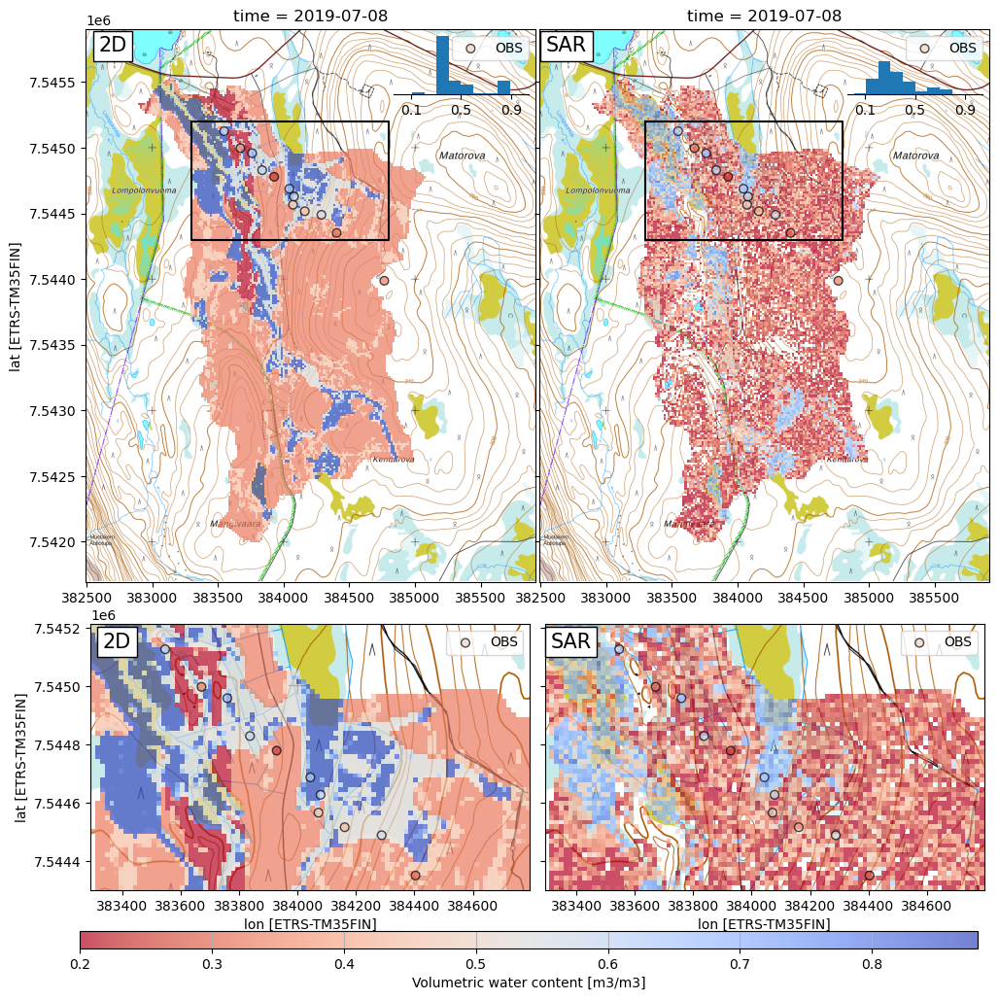

In [138]:
import matplotlib.patches as patches


def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

# SAR SPATIAL PLOTS
start_day = pd.to_datetime('2019-05-01')
end_day = pd.to_datetime('2019-09-15')

start = np.where(pd.to_datetime(dates_spa) == start_day)[0][0]
end = np.where(pd.to_datetime(dates_spa) == end_day)[0][0]

sar_wet_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).max())
sar_dry_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).min())

wet_day = pd.to_datetime(sar_m['time'][sar_wet_day].data[0])
dry_day = pd.to_datetime(sar_m['time'][sar_dry_day].data[0])

doi = np.where(pd.to_datetime(dates_spa[start:end]) == wet_day)[0][0]
d = pd.to_datetime(wet_day)

lims = [0.01,0.99]
bins = 10
ms = 40
ms2 = 30

date = '2019-07-08'
d = pd.to_datetime(pd.to_datetime(date))
doi = np.where(pd.to_datetime(dates_spa[start:end]) == date)[0][0]

bbox = [7.5452e6, 7.5443e6, 383300, 384800]
bbox_id = [np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[0]))[0][0],
           np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[1]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[2]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[3]))[0][0]]
xs = [bbox[2], bbox[3], bbox[3], bbox[2], bbox[2]]
ys = [bbox[0], bbox[0], bbox[1], bbox[1], bbox[0]]

props = dict(facecolor='white', alpha=1)


alp=0.7
ylims = [0.2,0.88]
ylimstemp = [0.08,0.5]
fig = plt.figure(figsize=(12,12))
gs = fig.add_gridspec(10, 10)

ax0 = fig.add_subplot(gs[0:7, 0:5])
ax1 = fig.add_subplot(gs[0:7, 5:10])
ax2 = fig.add_subplot(gs[7:10, 0:5])
ax3 = fig.add_subplot(gs[7:10, 5:10])

rasterio.plot.show(pk, transform=meta['transform'], ax=ax0);
im0 = res_2d['bucket_moisture_root'][start:end][doi].plot(ax=ax0, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax0, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')

ax0.plot(xs, ys, color="black")
ax0.text(0.06, 0.97,'2D', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax0.transAxes,
     bbox=props)

ix1 = inset_axes(ax0,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix1.hist((res_2d['bucket_moisture_root'][start:end][doi]*sar_mask).values.flatten()[~np.isnan((res_2d['bucket_moisture_root'][start:end][doi]*sar_mask).values.flatten())], bins=bins, range=lims)
ix1.patch.set_alpha(0.01)

ax0.legend()


rasterio.plot.show(pk, transform=meta['transform'], ax=ax0)
rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = sar_m['theta'].sel(time=d).plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax1.plot(xs, ys, color="black")
ax1.text(0.06, 0.97,'SAR', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)

ix2 = inset_axes(ax1,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix2.hist(sar_m['theta'].sel(time=d).values.flatten()[~np.isnan(sar_m['theta'].sel(time=d).values.flatten())], bins=bins, range=lims)
ix2.patch.set_alpha(0.01)

ax1.legend()

                                      # Create a Rectangle patch
#rect = patches.Rectangle((bbox[1], bbox[2]), bbox[0], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
# Add the patch to the Axes
#ax0.add_patch(rect)
# Coordinates of rectangle vertices
# in clockwise order

rasterio.plot.show(pk, transform=meta['transform'], ax=ax2)
im2 = res_2d['bucket_moisture_root'][start:end][doi][bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax2.legend()
ax2.text(0.06, 0.93,'2D', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax2.transAxes,
     bbox=props)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im3 = sar_m['theta'].sel(time=d)[bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax3.legend()
ax3.text(0.06, 0.93,'SAR', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax3.transAxes,
     bbox=props)
ax1.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])

ax0.set_xlabel('')
ax1.set_xlabel('')

ax1.set_ylabel('')
ax3.set_ylabel('')

ix1.axes.get_yaxis().set_ticklabels([])
ix2.axes.get_yaxis().set_ticklabels([])

ix1.set_yticks([])
ix2.set_yticks([])

ix1.set_xticks([])
ix2.set_xticks([])

ix1.set_ylim([0,12000])
ix2.set_ylim([0,12000])

ix1.set_xticks(np.arange(0.0,0.41,0.2))
ix2.set_xticks(np.arange(0.0,0.41,0.2))

ix1.spines[['right', 'top', 'left']].set_visible(False)
ix2.spines[['right', 'top', 'left']].set_visible(False)

ix1.grid(False)
ix2.grid(False)

ix1.set_xticks(np.arange(0.1,1.01,0.4))
ix2.set_xticks(np.arange(0.1,1.01,0.4))

ix1.set_ylim(0,8500)
ix2.set_ylim(0,8500)

cax = plt.axes([0.12, 0.06, 0.77, 0.015]) # 4-tuple of floats rect = [left, bottom, width, height]. A new axes is added
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label('Volumetric water content [m3/m3]')

ax2.set_title('')
ax3.set_title('')

plt.subplots_adjust(wspace=0.05, hspace=0.05)


plt.savefig(f'sar_spa_spat_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'sar_spa_spat_{today}.png', bbox_inches='tight', dpi=300)

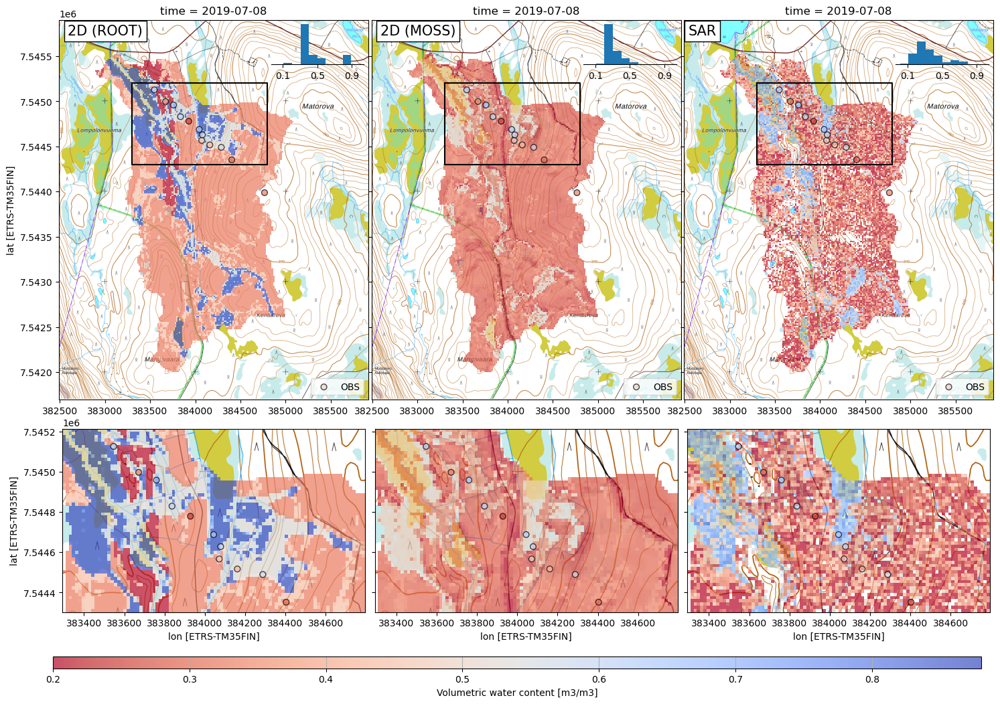

In [30]:
# SPATIAL COMPARISON 2D and SAR

import matplotlib.patches as patches


def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

# SAR SPATIAL PLOTS
start_day = pd.to_datetime('2019-05-01')
end_day = pd.to_datetime('2019-09-15')

start = np.where(pd.to_datetime(dates_spa) == start_day)[0][0]
end = np.where(pd.to_datetime(dates_spa) == end_day)[0][0]

sar_wet_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).max())
sar_dry_day = np.where(np.nansum(sar_m['theta'], axis=(1,2)) == np.nansum(sar_m['theta'], axis=(1,2)).min())

wet_day = pd.to_datetime(sar_m['time'][sar_wet_day].data[0])
dry_day = pd.to_datetime(sar_m['time'][sar_dry_day].data[0])

doi = np.where(pd.to_datetime(dates_spa[start:end]) == wet_day)[0][0]
d = pd.to_datetime(wet_day)

lims = [0.01,0.99]
bins = 10
ms = 40
ms2 = 30

date = '2019-07-08'
d = pd.to_datetime(pd.to_datetime(date))
doi = np.where(pd.to_datetime(dates_spa[start:end]) == date)[0][0]

bbox = [7.5452e6, 7.5443e6, 383300, 384800]
bbox_id = [np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[0]))[0][0],
           np.where(res_1d['lat'] == find_nearest(res_1d['lat'],bbox[1]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[2]))[0][0],
           np.where(res_1d['lon'] == find_nearest(res_1d['lon'],bbox[3]))[0][0]]
xs = [bbox[2], bbox[3], bbox[3], bbox[2], bbox[2]]
ys = [bbox[0], bbox[0], bbox[1], bbox[1], bbox[0]]

props = dict(facecolor='white', alpha=1)


alp=0.7
ylims = [0.2,0.88]
ylimstemp = [0.08,0.5]
fig = plt.figure(figsize=(18,12))
gs = fig.add_gridspec(10, 15)

ax0 = fig.add_subplot(gs[0:7, 0:5])
ax4 = fig.add_subplot(gs[0:7, 5:10])
ax2 = fig.add_subplot(gs[7:10, 0:5])
ax5 = fig.add_subplot(gs[7:10, 5:10])

ax1 = fig.add_subplot(gs[0:7, 10:15])
ax3 = fig.add_subplot(gs[7:10, 10:15])

rasterio.plot.show(pk, transform=meta['transform'], ax=ax0);
im0 = res_2d['bucket_moisture_root'][start:end][doi].plot(ax=ax0, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax0, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')

ax0.plot(xs, ys, color="black")
ax0.text(0.15, 0.97,'2D (ROOT)', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax0.transAxes,
     bbox=props)

ix1 = inset_axes(ax0,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix1.hist((res_2d['bucket_moisture_root'][start:end][doi]*sar_mask).values.flatten()[~np.isnan((res_2d['bucket_moisture_root'][start:end][doi]*sar_mask).values.flatten())], bins=bins, range=lims)
ix1.patch.set_alpha(0.01)

ax0.legend(loc='lower right')


rasterio.plot.show(pk, transform=meta['transform'], ax=ax0)
rasterio.plot.show(pk, transform=meta['transform'], ax=ax1);
im1 = sar_m['theta'].sel(time=d).plot(ax=ax1, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax1, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
ax1.plot(xs, ys, color="black")
ax1.text(0.06, 0.97,'SAR', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax1.transAxes,
     bbox=props)

ix2 = inset_axes(ax1,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix2.hist(sar_m['theta'].sel(time=d).values.flatten()[~np.isnan(sar_m['theta'].sel(time=d).values.flatten())], bins=bins, range=lims)
ix2.patch.set_alpha(0.01)

ax1.legend(loc='lower right')

                                      # Create a Rectangle patch
#rect = patches.Rectangle((bbox[1], bbox[2]), bbox[0], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
# Add the patch to the Axes
#ax0.add_patch(rect)
# Coordinates of rectangle vertices
# in clockwise order

rasterio.plot.show(pk, transform=meta['transform'], ax=ax2)
im2 = res_2d['bucket_moisture_root'][start:end][doi][bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax2, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax2, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
#ax2.legend(loc='lower right')
#ax2.text(0.06, 0.93,'2D', size=15,
#     horizontalalignment='center',
#     verticalalignment='center',
#     transform = ax2.transAxes,
#     bbox=props)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax3);
#im1 = ax2.imshow(results_catch['bucket_moisture_root'][start:end][maxd], cmap='coolwarm_r', vmin=0.1, vmax=0.88)
im3 = sar_m['theta'].sel(time=d)[bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax3, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)
theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax3, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
#ax3.legend()
#ax3.text(0.06, 0.93,'SAR', size=15,
#     horizontalalignment='center',
#     verticalalignment='center',
#     transform = ax3.transAxes,
#     bbox=props)

rasterio.plot.show(pk, transform=meta['transform'], ax=ax4);
im4 = res_2d['bucket_moisture_top'][start:end][doi].plot(ax=ax4, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax4, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')

ax4.plot(xs, ys, color="black")
ax4.text(0.15, 0.97,'2D (MOSS)', size=15,
     horizontalalignment='center',
     verticalalignment='center',
     transform = ax4.transAxes,
     bbox=props)

ix4 = inset_axes(ax4,
                    width="30%", # width = 30% of parent_bbox
                    height=0.6, # height : 1 inch
                    loc=1)
ix4.hist((res_2d['bucket_moisture_top'][start:end][doi]*sar_mask).values.flatten()[~np.isnan((res_2d['bucket_moisture_top'][start:end][doi]*sar_mask).values.flatten())], bins=bins, range=lims)
ix4.patch.set_alpha(0.01)

ax4.legend(loc='lower right')

rasterio.plot.show(pk, transform=meta['transform'], ax=ax5)
im5 = res_2d['bucket_moisture_top'][start:end][doi][bbox_id[0]:bbox_id[1],bbox_id[2]:bbox_id[3]].plot(ax=ax5, cmap='coolwarm_r', vmin=ylims[0], vmax=ylims[1], alpha=alp,
                                                          add_colorbar=False)

theta_spat_gpd.loc[(theta_spat_gpd.index == d) & (theta_spat_gpd['z'] == 20),
                   ['theta', 'geometry']].plot(column='theta',
                                               ax=ax5, cmap='coolwarm_r', edgecolor='black', linewidth=1,
                                               markersize=ms,
                                               alpha=alp, vmin=ylims[0], vmax=ylims[1], label='OBS')
#ax5.legend(loc='lower right')
#ax5.text(0.06, 0.93,'2D (TOP)', size=15,
#     horizontalalignment='center',
#     verticalalignment='center',
#     transform = ax5.transAxes,
#     bbox=props)

ax1.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])
ax4.axes.get_yaxis().set_ticklabels([])
ax5.axes.get_yaxis().set_ticklabels([])

ax0.set_xlabel('')
ax1.set_xlabel('')
ax4.set_xlabel('')

ax1.set_ylabel('')
ax4.set_ylabel('')
ax3.set_ylabel('')
ax5.set_ylabel('')

ix1.axes.get_yaxis().set_ticklabels([])
ix2.axes.get_yaxis().set_ticklabels([])
ix4.axes.get_yaxis().set_ticklabels([])

ix1.set_yticks([])
ix2.set_yticks([])
ix4.set_yticks([])

ix1.set_xticks([])
ix2.set_xticks([])
ix4.set_xticks([])

ix1.set_ylim([0,12000])
ix2.set_ylim([0,12000])
ix4.set_ylim([0,12000])

ix1.spines[['right', 'top', 'left']].set_visible(False)
ix2.spines[['right', 'top', 'left']].set_visible(False)
ix4.spines[['right', 'top', 'left']].set_visible(False)

ix1.grid(False)
ix2.grid(False)
ix4.grid(False)

ix1.set_xticks(np.arange(0.1,1.01,0.4))
ix2.set_xticks(np.arange(0.1,1.01,0.4))
ix4.set_xticks(np.arange(0.1,1.01,0.4))

ix1.set_ylim(0,8500)
ix2.set_ylim(0,8500)
ix4.set_ylim(0,8500)

cax = plt.axes([0.12, 0.04, 0.77, 0.015]) # 4-tuple of floats rect = [left, bottom, width, height]. A new axes is added
cbar1 = plt.colorbar(im1, cax=cax, orientation='horizontal')
cbar1.set_label('Volumetric water content [m3/m3]')

ax2.set_title('')
ax3.set_title('')
ax5.set_title('')

plt.subplots_adjust(wspace=0.05, hspace=0.05)

plt.savefig(f'sar_spa_spatial_comp_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'sar_spa_spatial_comp_{today}.png', bbox_inches='tight', dpi=300)

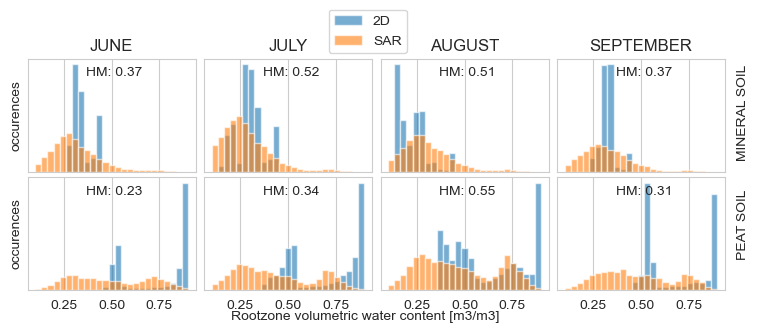

In [161]:
#%%
text1 = [0.35, 0.85]
alp=0.6
peat_lims = [0.1,0.9]
min_lims = [0.1,0.9]

fig = plt.figure(figsize=(9,3))
gs = fig.add_gridspec(2, 4)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])

ax5 = fig.add_subplot(gs[1, 0])
ax6 = fig.add_subplot(gs[1, 1])
ax7 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])

ax1.hist(d2_sarmask_moist_mineral[june_id_sarmask].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax1.hist(sar_moist_mineral[june_id_sar].flatten(), bins=25, range=min_lims, alpha=alp, label='SAR')
ax1.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[june_id_sarmask].flatten(),sar_moist_mineral[june_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax1.transAxes)
ax1.legend(ncol=1,bbox_to_anchor=(2.3,1.5))
ax1.set_title('JUNE')
ax1.set_ylabel('occurences')

ax2.hist(d2_sarmask_moist_mineral[july_id_sarmask].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax2.hist(sar_moist_mineral[july_id_sar].flatten(), bins=25, range=min_lims, alpha=alp, label='SAR')
ax2.set_title('JULY')
ax2.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[july_id_sarmask].flatten(),sar_moist_mineral[july_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax2.transAxes)

ax3.hist(d2_moist_mineral[august_id_sarmask].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax3.hist(sar_moist_mineral[august_id_sar].flatten(), bins=25, range=min_lims, alpha=alp, label='SAR')
ax3.set_title('AUGUST')
ax3.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[august_id_sarmask].flatten(),sar_moist_mineral[august_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax3.transAxes)

ax4.hist(d2_moist_mineral[sept_id_sarmask].flatten(), bins=25, range=min_lims, alpha=alp, label='2D')
ax4.hist(sar_moist_mineral[sept_id_sar].flatten(), bins=25, range=min_lims, alpha=alp, label='SAR')
ax4.set_title('SEPTEMBER')
ax4.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_mineral[sept_id_sarmask].flatten(),sar_moist_mineral[sept_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax4.transAxes)

###
ax5.hist(d2_moist_peat[june_id_sarmask].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax5.hist(sar_moist_peat[june_id_sar].flatten(), bins=25, range=peat_lims, alpha=alp, label='SAR')
ax5.set_ylabel('occurences')
ax5.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[june_id_sarmask].flatten(),sar_moist_peat[june_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax5.transAxes)

ax6.hist(d2_moist_peat[july_id_sarmask].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax6.hist(sar_moist_peat[july_id_sar].flatten(), bins=25, range=peat_lims, alpha=alp, label='SAR')
ax6.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[july_id_sarmask].flatten(),sar_moist_peat[july_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax6.transAxes)


ax7.hist(d2_moist_peat[august_id_sarmask].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax7.hist(sar_moist_peat[august_id_sar].flatten(), bins=25, range=peat_lims, alpha=alp, label='SAR')
ax7.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[august_id_sarmask].flatten(),sar_moist_peat[august_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax7.transAxes)

ax8.hist(d2_moist_peat[sept_id_sarmask].flatten(), bins=25, range=peat_lims, alpha=alp, label='2D')
ax8.hist(sar_moist_peat[sept_id_sar].flatten(), bins=25, range=peat_lims, alpha=alp, label='SAR')
ax8.text(text1[0], text1[1], f'HM: {histogram_match(d2_moist_peat[sept_id_sarmask].flatten(),sar_moist_peat[sept_id_sar].flatten(), bins=25, lims=min_lims)}',
         fontsize=10, transform=ax8.transAxes)

ax1.axes.get_yaxis().set_ticklabels([])
ax1.set_yticks([])
ax2.set_yticks([])

ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])

ax2.axes.get_yaxis().set_ticklabels([])
ax3.axes.get_yaxis().set_ticklabels([])
ax4.axes.get_yaxis().set_ticklabels([])
ax1.axes.get_xaxis().set_ticklabels([])
ax2.axes.get_xaxis().set_ticklabels([])
ax3.axes.get_xaxis().set_ticklabels([])
ax4.axes.get_xaxis().set_ticklabels([])

ax5.axes.get_yaxis().set_ticklabels([])
ax6.axes.get_yaxis().set_ticklabels([])
ax7.axes.get_yaxis().set_ticklabels([])
ax8.axes.get_yaxis().set_ticklabels([])

ax1.xaxis.set_ticks_position('none')
ax2.xaxis.set_ticks_position('none')
ax3.xaxis.set_ticks_position('none')
ax4.xaxis.set_ticks_position('none')

ax2.yaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax4.yaxis.set_ticks_position('none')
ax6.yaxis.set_ticks_position('none')
ax7.yaxis.set_ticks_position('none')
ax8.yaxis.set_ticks_position('none')

#ax1.grid()
#ax2.grid()
#ax3.grid()
#ax4.grid()
#ax5.grid()
#ax6.grid()
#ax7.grid()
#ax8.grid()

plt.subplots_adjust(wspace=0.05, hspace=0.05)
fig.text(0.5, 0.01, 'Rootzone volumetric water content [m3/m3]', ha='center')

fig.text(0.92, 0.55, 'MINERAL SOIL', rotation='vertical', ha='center')
fig.text(0.92, 0.22, 'PEAT SOIL', rotation='vertical', ha='center')

plt.savefig(f'histogram_sarspa_{today}.pdf', bbox_inches='tight', dpi=300)
plt.savefig(f'histogram_sarspa_{today}.png', bbox_inches='tight', dpi=300)